#  **Term Project – AI570: Deep Learning Applications**  
## **Object Detection in Cityscapes Using Faster R-CNN**  
## 👥 **Authors:** Art Casasa, Tony Acosta  

---

##  Introduction  
Object detection is a critical task in computer vision — especially in urban environments where autonomous systems must detect people, cars, bicycles, and traffic signs in complex street scenes.

In this project, we implement **Faster R-CNN** with a **ResNet50-FPN backbone**, leveraging the **COCO-pretrained weights (DEFAULT)** from torchvision, and fine-tune it on the **Cityscapes** dataset — a gold-standard benchmark featuring high-resolution street-level imagery and dense polygonal annotations.

---

##  Project Goals  
- Build an object detection pipeline using **Faster R-CNN**  
- Apply **transfer learning** with COCO-pretrained ResNet50-FPN weights  
- Train on **Cityscapes** fine annotations (`gtFine`) paired with RGB images from `leftImg8bit`  
- **Grid-search** key hyperparameters (head LR, backbone LR, weight decay, unfreeze strategy, score threshold) on a small overfit subset to find the best configuration  
- Evaluate model performance using **COCO-style mAP metrics**: `mAP@.50`, `mAP@.75`, and `mAP@[.50:.95]`  

---

##  Why Faster R-CNN?  
✅ Two-stage detector with superior accuracy on small and occluded objects  
✅ Feature Pyramid Networks (FPN) for multi-scale feature learning  
✅ ResNet50 Backbone for powerful transfer learning  

---

## 🗂️ Dataset Overview  
All images and annotations come from two zips:  
- `leftImg8bit_trainvaltest.zip` → 5,000 RGB images  
- `gtFine_trainvaltest.zip` → Annotations for 2,975 train + 500 val + 1,525 test  

| Subset               | Source Folder         | Image Count | Usage Description                    |
|----------------------|-----------------------|-------------|--------------------------------------|
| `leftImg8bit/train`  | RGB images            | 2,975       | Training and internal test inputs    |
| `gtFine/train`       | Fine polygons         | 2,975       | Labels for training + internal test  |
| `leftImg8bit/val`    | RGB images            | 500         | Validation inputs                    |
| `gtFine/val`         | Fine polygons         | 500         | Validation labels                    |
| `leftImg8bit/test`   | RGB images            | 1,525       | **Unused — no annotations**          |
| `gtFine/test`        | Dummy annotations     | 1,525       | **Black-boxed — not used**           |

 We **exclude** `gtCoarse`, `train_extra`, and the official test set (no public annotations).

---

##  Training Strategy  
To evaluate generalization without the hidden test server, we carve out a **10% internal test split** from the `train` set:

| Phase        | Images                        | Annotations         | Purpose                                      |
|--------------|-------------------------------|---------------------|----------------------------------------------|
| Fine-tuning  | 90% of `leftImg8bit/train`    | 90% of `gtFine/train` | Learn object detection                      |
| Validation   | `leftImg8bit/val`             | `gtFine/val`        | Hyperparameter tuning & overfit monitoring   |
| Testing      | 10% of `leftImg8bit/train`    | 10% of `gtFine/train` | Final evaluation on unseen hold-out data    |

---

##  Code Implementation Plan  
1️⃣ **Import Required Libraries**  
2️⃣ **Explore & Analyze the Dataset**  
3️⃣ **Preprocess & Augment Images**  
4️⃣ **Define and Customize Faster R-CNN**  
5️⃣ **Grid-Search Hyperparameters** on a small overfit subset  
6️⃣ **Train and Validate the Model** with best configuration  
7️⃣ **Evaluate, Plot Results, and Run Inference**  

 *Let’s get started!*  


0. ### Set-UP

##  Colab Setup — Install Required Packages

Before we begin, we need to install a couple of essential libraries:

- **`torchmetrics`**: Provides easy-to-use COCO-style mAP and other detection metrics.
- **`pycocotools`**: Enables parsing and working with COCO-format annotations (required by torchvision detectors).

Run this cell once per session to ensure all dependencies are available.
```bash

In [1]:

#  Colab Setup — Install Required Packages
try:
    import torchmetrics
    import pycocotools
    print("✅ torchmetrics & pycocotools already installed.")
except ImportError:
    print(" Installing missing packages…")
    !pip install -q --upgrade torchmetrics pycocotools
    import torchmetrics  # re-import to confirm
    import pycocotools
    print("✅ Installed torchmetrics & pycocotools.")






 Installing missing packages…
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 70.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.0 MB/s eta 0:00:00
✅ Installed torchmetrics & pycocotools.


In [2]:
# ✅ Mount Drive if in Colab, and set base data root
try:
    from google.colab import drive
    drive.mount('/content/drive')
    CITYSCAPES_ROOT = '/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data'
    print(f"✅ Colab detected. Mounted Drive, using CITYSCAPES_ROOT = {CITYSCAPES_ROOT}")
except ImportError:
    CITYSCAPES_ROOT = '/path/to/Cityscapes_Term_Project_Data'
    print(f"⚠️ Not in Colab. Using local CITYSCAPES_ROOT = {CITYSCAPES_ROOT}")




Mounted at /content/drive
✅ Colab detected. Mounted Drive, using CITYSCAPES_ROOT = /content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data


## **1. Import Required Libraries**

In [3]:
# ─── 0. Imports & Device Setup ─────────────────────────────────────────────────

# ✅ System & Utility Libraries
import os
import time
import random
import glob
import json
import zipfile
from collections import Counter
import gc

# ✅ PyTorch & TorchVision
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torchvision import transforms
from torchvision.transforms import functional as F
from torchvision.models.detection import fasterrcnn_resnet50_fpn, maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# ✅ Optimizers & LR Schedulers
from torch.optim import SGD, AdamW
from torch.optim.lr_scheduler import StepLR

# ✅ Evaluation Metrics
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# ✅ Image Processing & Visualization
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from PIL import Image
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_tensor, to_pil_image
from datetime import datetime

# …later, when you need the notebook‐display widget…
from IPython.display import Image as IPyImage, display

# ✅ Progress Bars
from tqdm.notebook import tqdm

# ✅ Multiprocessing Strategy
import torch.multiprocessing as mp
try:
    mp.set_start_method("fork", force=True)
except (RuntimeError, AssertionError):
    pass
from concurrent.futures import ThreadPoolExecutor

# ✅ DataFrame & Logging
import pandas as pd

# ✅ Standard Python itertools for grid search
from itertools import product

# ✅ Device Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f" Using device: {device}")





 Using device: cuda


## 2️. Exploratory Data Analysis (EDA)

Before diving into model training, we explore the Cityscapes dataset to understand:

-  **Directory structure & file layout**  
  - 2,975 `train` images in 18 cities  
  - 500 `val` images in 3 cities  
-  **Image characteristics**  
  - All RGB & annotation images are **2048×1024** pixels  
-  **Annotation content**  
  - Fine‐polygon files → converted to bounding boxes  
  - Mapped to 8 COCO‐style object classes + background  
-  **Label distribution & class frequency**  
  - Extremely imbalanced:  
    - Top classes: `pole` (42 904), `static` (38 430), `car` (27 155), `traffic sign` (20 868)  
    - Less frequent: `bus`, `train`, `motorcycle`, `bicycle`  

This analysis helped us confirm that:

✅ **Preprocessing** (resizing or full-res, normalization)  
✅ **Model config** (num_classes=9, label mapping)  
✅ **Augmentation needs** (horizontal flips only on train)  
✅ **Resources** (memory & performance trade-offs)





### 2.1 Directory Structure Preview

In [4]:
# ✅ Unzip Cityscapes files if not already extracted
# This step ensures that the raw dataset archives are unpacked into the proper folders.
# It’s idempotent: it only extracts if the target directory doesn’t already exist.


# Paths to the zipped datasets in your Google Drive
zip_paths = {
    "gtFine":     "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/gtFine_trainvaltest.zip",
    "leftImg8bit":"/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/leftImg8bit_trainvaltest.zip"
}

# The directory into which each zip should be extracted
destination_path = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data"

for name, zip_file in zip_paths.items():
    # Define where this archive should be unpacked
    extract_path = os.path.join(destination_path, name)
    if not os.path.exists(extract_path):
        print(f"📦 Unzipping {name}...")
        # Open and extract the zip archive
        with zipfile.ZipFile(zip_file, "r") as zip_ref:
            zip_ref.extractall(destination_path)
        print(f"✅ {name} extracted to {extract_path}")
    else:
        # If the folder already exists, skip extraction
        print(f"✅ {name} already unzipped.")



✅ gtFine already unzipped.
✅ leftImg8bit already unzipped.


In [5]:
# ✅ Inspect directory structure of the extracted Cityscapes dataset
# This verifies that our unzip step placed the files in the expected locations.



# Paths to the root folders for Cityscapes images and annotations
CITYSCAPES_ROOT = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data"
GT_FINE_DIR     = os.path.join(CITYSCAPES_ROOT, "gtFine")
LEFT_IMG_DIR    = os.path.join(CITYSCAPES_ROOT, "leftImg8bit")

# List contents to confirm correct extraction
print("📁 Contents of Cityscapes root:")
print(os.listdir(CITYSCAPES_ROOT))

print("\n📁 Contents of gtFine (annotations):")
print(os.listdir(GT_FINE_DIR))

print("\n📁 Contents of leftImg8bit (images):")
print(os.listdir(LEFT_IMG_DIR))



📁 Contents of Cityscapes root:
['gtFine_trainvaltest.zip', '.DS_Store', 'gtFine', 'leftImg8bit_trainvaltest.zip', 'README', 'license.txt', 'leftImg8bit', 'epoch_predictions', 'best_prediction_epoch_1.png', 'best_prediction_epoch_2.png', 'best_prediction_epoch_5.png', 'best_prediction_epoch_6.png', 'best_prediction_epoch_7.png', 'best_prediction_epoch_8.png', 'best_prediction_epoch_10.png', 'best_prediction_epoch_12.png', 'best_prediction_epoch_13.png', 'best_prediction_epoch_15.png', 'best_prediction_epoch_17.png', 'best_prediction_epoch_19.png', 'best_prediction_epoch_20.png', 'best_prediction_epoch_27.png', 'faster_rcnn_cityscapes_best.pth', 'epoch_metrics_log.csv', 'checkpoints', 'logs', 'epoch_summaries', 'debug_inference']

📁 Contents of gtFine (annotations):
['.DS_Store', 'train', 'test', 'val', 'label_counts_cache.json']

📁 Contents of leftImg8bit (images):
['train', 'val', 'test']


### 2.2 List Object Categories in a Sample Annotation

Load one example annotation JSON from the `train` split and extract all object labels it contains.  
This quick check helps us verify which classes appear in the data and ensures our downstream label mapping covers them.


In [6]:

# ✅ Pick a representative city and annotation file from the training set
sample_city = "aachen"
sample_file = os.path.join(
    GT_FINE_DIR, "train", sample_city,
    f"{sample_city}_000000_000019_gtFine_polygons.json"
)

# ✅ Load the JSON and collect all unique 'label' entries
with open(sample_file) as f:
    sample_data = json.load(f)

labels_in_sample = { obj["label"] for obj in sample_data["objects"] }

print("🔖 Object Labels in Sample Annotation File:")
print(sorted(labels_in_sample))



🔖 Object Labels in Sample Annotation File:
['bicycle', 'building', 'car', 'ego vehicle', 'license plate', 'out of roi', 'person', 'pole', 'rider', 'road', 'sidewalk', 'sky', 'static', 'terrain', 'traffic sign', 'vegetation']


### 2.3 Class Frequency Overview

Count the frequency of each object label across all training annotation files.  
This informs us which classes dominate the dataset and may guide any balancing or sampling strategies.


In [7]:


### 2.3 Class Frequency Overview

#  Gather all polygon‐annotation JSON paths from the training split
polygon_files = glob.glob(
    os.path.join(GT_FINE_DIR, "train", "*", "*_gtFine_polygons.json")
)

#  Define path to cache file
cache_path = os.path.join(GT_FINE_DIR, "label_counts_cache.json")

# ✅ Load cache if available
if os.path.exists(cache_path):
    with open(cache_path, "r") as f:
        label_counts = Counter(json.load(f))
    print("✅ Loaded label counts from cache.")
else:
    #  Parallel file parser
    def count_labels(path):
        try:
            with open(path) as f:
                data = json.load(f)
            return [obj["label"] for obj in data.get("objects", [])]
        except Exception as e:
            print(f"⚠️ Failed to read {os.path.basename(path)}: {e}")
            return []

    label_counts = Counter()
    with ThreadPoolExecutor() as executor:
        for labels in tqdm(
            executor.map(count_labels, polygon_files),
            total=len(polygon_files),
            desc="🔍 Counting labels (parallel)"
        ):
            label_counts.update(labels)

    # 💾 Save to cache
    with open(cache_path, "w") as f:
        json.dump(dict(label_counts), f)
    print(f"💾 Saved label counts to cache → {cache_path}")

#  Print Top 10 most frequent labels
sorted_labels = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
print("\ Top 10 Most Common Labels:")
for label, count in sorted_labels[:10]:
    print(f"{label:20s}: {count:,}")




✅ Loaded label counts from cache.
\ Top 10 Most Common Labels:
pole                : 42,904
static              : 38,430
car                 : 27,155
traffic sign        : 20,868
person              : 17,994
vegetation          : 15,022
traffic light       : 10,237
building            : 7,141
sidewalk            : 7,132
license plate       : 5,424



### 2.4 Plotting Top Classes

Visualize the frequency distribution of the top 20 object classes in the training set.  
This bar chart helps identify which classes are most prevalent and may require special attention during training.




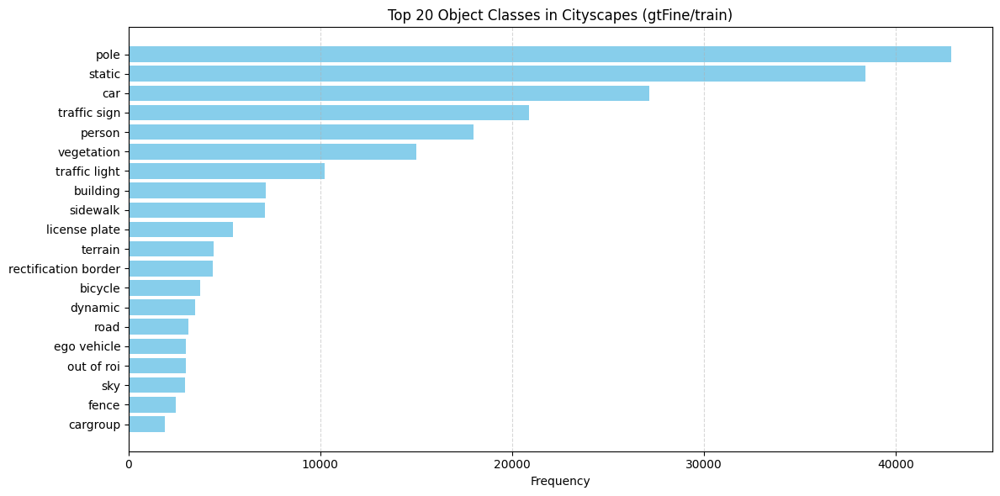

In [8]:


# ✅ Extract the top-20 labels and their counts
labels, counts = zip(*sorted_labels[:20])

# ✅ Create a horizontal bar chart (invert order so the highest count is at the top)
plt.figure(figsize=(12, 6))
plt.barh(labels[::-1], counts[::-1], color="skyblue")

# ✅ Formatting
plt.title("Top 20 Object Classes in Cityscapes (gtFine/train)")
plt.xlabel("Frequency")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()

# ✅ Display the plot
plt.show()



### 2.5 Visualizing Sample Images from Cityscapes

To get an overview of the dataset content and diversity, we’ll display:

1. **Annotated Overlays**  
   20 random images from `gtFine/train` with polygon-based ground-truth overlays.  
   *(Call your single helper with `suffix="_color.png"`.)*

2. **Raw RGB Inputs**  
   20 random images from `leftImg8bit/train` (no overlays).  
   *(Call the same helper with `suffix="_leftImg8bit.png"`.)*

This helps us:
- Verify that our annotations align correctly with the raw inputs.  
- Appreciate the visual diversity of urban scenes that the model will learn from.  



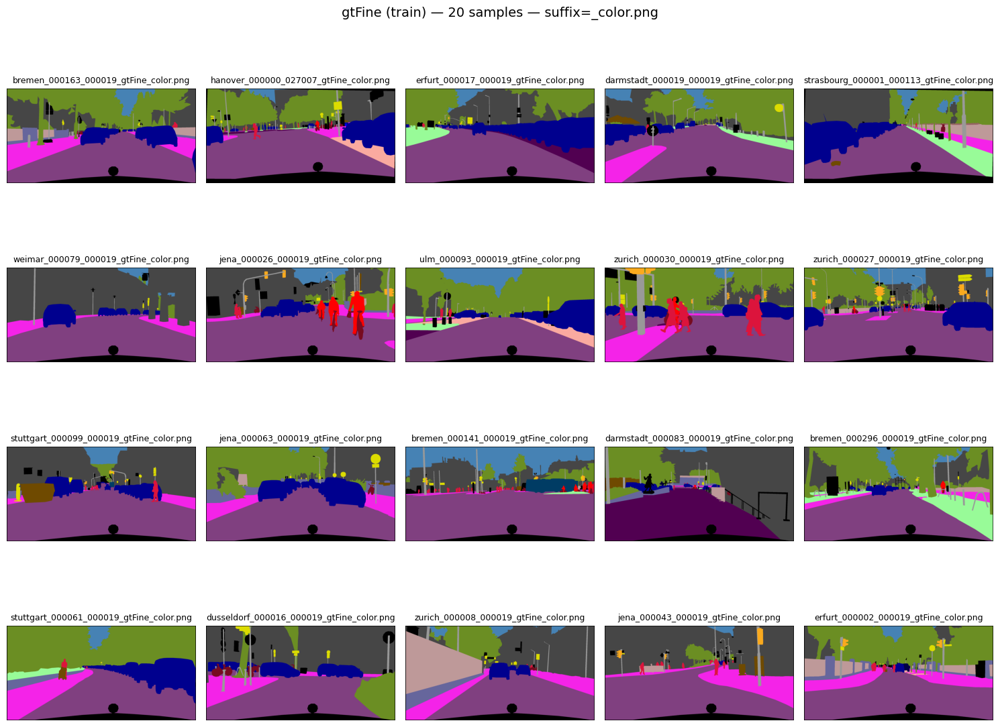

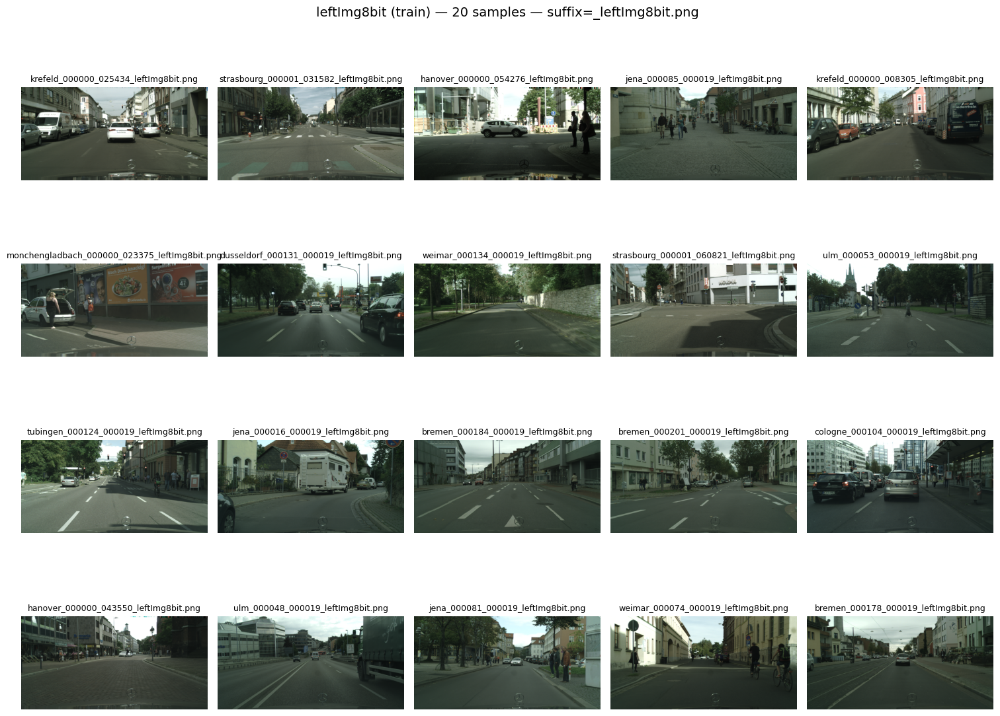

In [9]:


def show_sample_images(dataset_dir, split="train", dataset_name="Cityscapes",
                       suffix="_color.png", num_images=20):
    """
    Display random images from a Cityscapes split using the given file suffix.
    """
    split_path = os.path.join(dataset_dir, split)
    cities     = [c for c in os.listdir(split_path)
                  if os.path.isdir(os.path.join(split_path, c))]
    all_images = []
    for city in cities:
        city_path = os.path.join(split_path, city)
        for f in os.listdir(city_path):
            if f.endswith(suffix):
                all_images.append(os.path.join(city_path, f))

    if not all_images:
        print(f"⚠️ No images found in {dataset_name}/{split} with suffix {suffix}")
        return

    sample_images = random.sample(all_images, min(num_images, len(all_images)))
    cols          = 5
    rows          = (len(sample_images) + cols - 1) // cols
    fig, axes     = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes          = axes.flatten()

    for i, img_path in enumerate(sample_images):
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(os.path.basename(img_path), fontsize=9)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(f"{dataset_name} ({split}) — {len(sample_images)} samples — suffix={suffix}",
                 fontsize=14)
    plt.tight_layout()
    plt.show()

# ✅ Display 20 annotated overlays from gtFine/train
show_sample_images(
    os.path.join(CITYSCAPES_ROOT, "gtFine"),
    split="train",
    dataset_name="gtFine",
    suffix="_color.png",
    num_images=20
)

# ✅ Display 20 raw RGB inputs from leftImg8bit/train
show_sample_images(
    os.path.join(CITYSCAPES_ROOT, "leftImg8bit"),
    split="train",
    dataset_name="leftImg8bit",
    suffix="_leftImg8bit.png",
    num_images=20
)


### 2.6 Cities in Cityscapes Dataset Splits
This step lists the available cities within each split (train, val, and optionally test) for both:

✅ gtFine – used for bounding box annotations

✅ leftImg8bit – used for raw RGB input images

It helps confirm the dataset was correctly extracted and organized.


In [10]:
def list_all_cities_by_split(dataset_dir, dataset_name):
    """
    Lists all cities available in each split (train/val/test) for the given dataset directory.
    """
    print(f"\n📍 Cities in {dataset_name} dataset:")
    for split in sorted(os.listdir(dataset_dir)):
        split_path = os.path.join(dataset_dir, split)
        if not os.path.isdir(split_path):
            continue
        cities = sorted([
            c for c in os.listdir(split_path)
            if os.path.isdir(os.path.join(split_path, c))
        ])
        print(f"\n🔹 {split} split — {len(cities)} cities:")
        for city in cities:
            print(f"   • {city}")

# ✅ Call the function with correct paths
list_all_cities_by_split(GT_FINE_DIR, "gtFine (Annotations)")
list_all_cities_by_split(LEFT_IMG_DIR, "leftImg8bit (RGB Images)")




📍 Cities in gtFine (Annotations) dataset:

🔹 test split — 6 cities:
   • berlin
   • bielefeld
   • bonn
   • leverkusen
   • mainz
   • munich

🔹 train split — 18 cities:
   • aachen
   • bochum
   • bremen
   • cologne
   • darmstadt
   • dusseldorf
   • erfurt
   • hamburg
   • hanover
   • jena
   • krefeld
   • monchengladbach
   • strasbourg
   • stuttgart
   • tubingen
   • ulm
   • weimar
   • zurich

🔹 val split — 3 cities:
   • frankfurt
   • lindau
   • munster

📍 Cities in leftImg8bit (RGB Images) dataset:

🔹 test split — 6 cities:
   • berlin
   • bielefeld
   • bonn
   • leverkusen
   • mainz
   • munich

🔹 train split — 18 cities:
   • aachen
   • bochum
   • bremen
   • cologne
   • darmstadt
   • dusseldorf
   • erfurt
   • hamburg
   • hanover
   • jena
   • krefeld
   • monchengladbach
   • strasbourg
   • stuttgart
   • tubingen
   • ulm
   • weimar
   • zurich

🔹 val split — 3 cities:
   • frankfurt
   • lindau
   • munster


### 2.7 Checking Image Size Consistency

This step verifies that all Cityscapes images—including annotation masks (_labelIds.png) and raw RGB inputs—have the expected dimensions (2048×1024). Ensuring consistent sizing upfront prevents downstream shape mismatches or cropping errors.


In [11]:
def check_image_sizes(dataset_path, dataset_name, subset="train", suffix="_labelIds.png", sample_size=100):
    """
    Checks and prints unique image sizes in a dataset subset.
    """
    print(f"\n Checking Image Sizes in {dataset_name}/{subset}...")
    image_paths = glob.glob(os.path.join(dataset_path, subset, "*", f"*{suffix}"))
    sizes = set()
    for img_path in image_paths[:sample_size]:
        with Image.open(img_path) as img:
            sizes.add(img.size)
    print(f" Unique sizes in {dataset_name}/{subset}: {sizes}")
    print(f" Sampled {min(len(image_paths), sample_size)} of {len(image_paths)} images.")

# ✅ Use correct variable names
check_image_sizes(GT_FINE_DIR, "gtFine", subset="train", suffix="_labelIds.png")
check_image_sizes(LEFT_IMG_DIR, "leftImg8bit", subset="train", suffix="_leftImg8bit.png")




 Checking Image Sizes in gtFine/train...
 Unique sizes in gtFine/train: {(2048, 1024)}
 Sampled 100 of 2975 images.

 Checking Image Sizes in leftImg8bit/train...
 Unique sizes in leftImg8bit/train: {(2048, 1024)}
 Sampled 100 of 2975 images.


### 2.8 Visualize Raw Cityscapes RGB Inputs

This utility displays random **leftImg8bit** images from the Cityscapes dataset's `train` split. These are the **actual input RGB frames** used during training.

- Each image is 2048×1024 pixels (unless resized)
- No labels or overlays are shown — pure input visuals
- Helpful for inspecting input diversity across different cities

You can toggle the number of samples and the split (`train`, `val`, or `test`).


/usr/local/lib/python3.11/dist-packages/torchvision/utils.py:233: UserWarning: Argument 'font_size' will be ignored since 'font' is not set.
  warnings.warn("Argument 'font_size' will be ignored since 'font' is not set.")


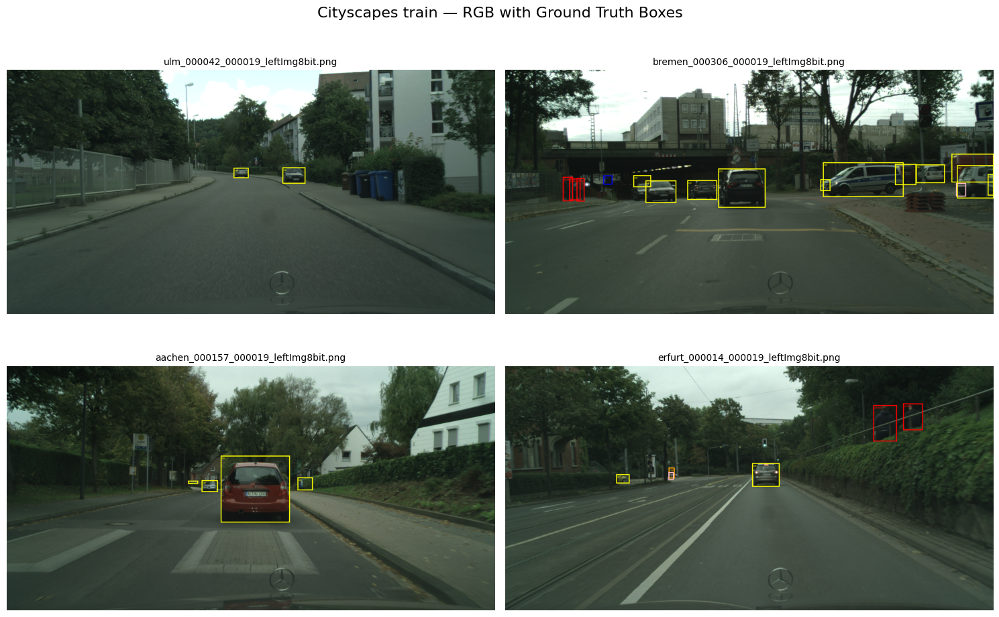

In [12]:


# Mapping class labels to IDs and colors
CITYSCAPES_CLASSES = {
    "person": 1, "rider": 2, "car": 3, "truck": 4,
    "bus": 5, "train": 6, "motorcycle": 7, "bicycle": 8
}
CLASS_COLORS = {
    1: "red", 2: "orange", 3: "yellow", 4: "green",
    5: "blue", 6: "purple", 7: "brown", 8: "pink"
}

# 🔁 Reverse mapping from class IDs to names for display
CLASS_NAMES = {
    1: "person", 2: "rider", 3: "car", 4: "truck",
    5: "bus", 6: "train", 7: "motorcycle", 8: "bicycle"
}


def visualize_gt_boxes(img_root, ann_root, split="train", num_images=4, seed=42):
    """
    Show RGB images with ground-truth bounding boxes from polygon annotations.
    """
    random.seed(seed)
    split_img_path = os.path.join(img_root, split)
    split_ann_path = os.path.join(ann_root, split)

    cities = sorted(os.listdir(split_img_path))
    all_pairs = []

    for city in cities:
        city_img_dir = os.path.join(split_img_path, city)
        city_ann_dir = os.path.join(split_ann_path, city)
        for fname in os.listdir(city_img_dir):
            if fname.endswith("_leftImg8bit.png"):
                base = fname.replace("_leftImg8bit.png", "")
                img_path = os.path.join(city_img_dir, fname)
                ann_path = os.path.join(city_ann_dir, base + "_gtFine_polygons.json")
                if os.path.exists(ann_path):
                    all_pairs.append((img_path, ann_path))

    sample_pairs = random.sample(all_pairs, min(num_images, len(all_pairs)))
    cols = 2
    rows = (len(sample_pairs) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()

    for ax, (img_path, ann_path) in zip(axes, sample_pairs):
        img = Image.open(img_path).convert("RGB")
        with open(ann_path) as f:
            data = json.load(f)

        boxes, labels = [], []
        for obj in data["objects"]:
            lbl = obj["label"]
            poly = obj.get("polygon", [])
            if lbl in CITYSCAPES_CLASSES and poly:
                x0 = min(p[0] for p in poly)
                y0 = min(p[1] for p in poly)
                x1 = max(p[0] for p in poly)
                y1 = max(p[1] for p in poly)
                if x1 > x0 and y1 > y0:
                    boxes.append([x0, y0, x1, y1])
                    labels.append(CITYSCAPES_CLASSES[lbl])

        if boxes:
            img_tensor = to_tensor(img).mul(255).byte()
            boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
            label_texts = [lbl for lbl in labels]
            colors = [CLASS_COLORS.get(l, "white") for l in labels]
            vis = draw_bounding_boxes(img_tensor, boxes_tensor, labels=[str(CLASS_NAMES.get(l, l)) for l in labels],
                                      colors=colors, width=4, font_size=16)
            img_disp = to_pil_image(vis)
        else:
            img_disp = img

        ax.imshow(img_disp)
        ax.set_title(os.path.basename(img_path), fontsize=10)
        ax.axis("off")

    for ax in axes[len(sample_pairs):]:
        ax.axis("off")

    plt.suptitle(f"Cityscapes {split} — RGB with Ground Truth Boxes", fontsize=16)
    plt.tight_layout()
    plt.show()

# ✅ Run it — pass your image and annotation paths here
IMG_ROOT = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/leftImg8bit"
ANN_ROOT = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/gtFine"
visualize_gt_boxes(IMG_ROOT, ANN_ROOT, split="train", num_images=4)




### 2.9 Exploratory Data Analysis (EDA) Summary

In this section, we performed a thorough exploration of the Cityscapes dataset to inform our preprocessing and modeling decisions:

- **Directory structure & contents**  
  Verified that the `leftImg8bit` and `gtFine` archives unpack correctly, and listed the `train`/`val`/`test` splits and their city subfolders.

- **Annotation vocabulary & distribution**  
  Parsed sample polygon files to enumerate object labels (e.g., `person`, `car`, `traffic sign`, etc.) and counted their frequency across the entire training set, revealing a long-tailed distribution (poles, static backgrounds, cars most common).

- **Image characteristics**  
  Confirmed that all RGB and label mask images share a uniform size (2048×1024). Examined pixel value ranges after normalization (roughly –2 to +2).

- **Visual sampling**  
  Displayed random subsets of raw images (`leftImg8bit/train`), annotation overlays (`gtFine/train`), and grids of GT bounding boxes to verify correct alignment of inputs and targets.

- **City splits & train/val/test partitioning**  
  Listed cities in each split to confirm data organization. Carved out a random 10% internal test set from the original training images to hold out unseen examples for final evaluation.

These EDA steps validate that our data pipeline is correct and highlight important characteristics—such as class balance, image resolution, and annotation quality—that guide our downstream preprocessing, augmentation, and model configuration choices.


## 3. Data Preprocessing & Augmentation

In this section we prepare our inputs for the COCO-pretrained Faster R-CNN:

- **3.1 Define Image Transformations**  
  Build a `torchvision.transforms.Compose` pipeline to (optionally) resize, randomly flip, tensor-ify, and normalize images.

- **3.2 Custom Dataset Class**  
  Implement `CityscapesDataset` to:
  1. Load leftImg8bit images and gtFine polygon annotations  
  2. Convert polygons → bounding boxes + class IDs  
  3. Apply resizing and joint image+box flips  
  4. Sanity-check for degenerate boxes  

- **3.3 Instantiate Datasets & Sanity Checks**  
  Create `train_dataset_fine` and `val_dataset_fine`, verify lengths, and display a few transformed samples with bounding boxes.



### 3.1 Define Image Transformations

In this section, we set up the input pipeline so images and targets are prepared exactly the way the COCO-pretrained Faster R-CNN expects:

1. **Resize** (optional): Downsample full-resolution (2048×1024) images to a smaller size (e.g. 512×1024) for faster iteration, or keep full-res if your GPU can handle it.  
2. **Random Horizontal Flip**: Jointly flip images and boxes during training to augment data.  
3. **ToTensor**: Convert PIL `Image` → `torch.Tensor` in `[0,1]`.  
4. **Normalize**: Standard ImageNet means/stds (`[0.485,0.456,0.406]`, `[0.229,0.224,0.225]`) to match COCO-pretrained backbone.  

Once defined, these transforms will be applied in our custom `CityscapesDataset`, ensuring that:
- Bounding-box coordinates are scaled correctly when resizing.
- Boxes are flipped in sync with their images.



In [13]:
### 3.1 Define Image Transformations


# Whether to downsample images or keep full resolution
RESIZE_IMAGES = False

if RESIZE_IMAGES:
    resize_transform = transforms.Resize((512, 1024))
    print("📏 Resizing images to (512×1024)")
else:
    resize_transform = transforms.Lambda(lambda x: x)
    print("📏 Keeping full‑resolution images (1024×2048)")

# ─── TRAIN transforms (with horizontal flip) ───────────────────────────────────
train_transforms = transforms.Compose([
    resize_transform,
    transforms.RandomHorizontalFlip(p=0.5),   # ← flip for augmentation on train
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std =[0.229, 0.224, 0.225]
    ),
])

# ─── VAL / TEST transforms (no flip) ──────────────────────────────────────────
val_transforms = transforms.Compose([
    resize_transform,
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std =[0.229, 0.224, 0.225]
    ),
])

print("✅ Defined `train_transforms` (with flip) and `val_transforms` (no flip).")



📏 Keeping full‑resolution images (1024×2048)
✅ Defined `train_transforms` (with flip) and `val_transforms` (no flip).


### 3.2 Define Custom Dataset Class: CityscapesDataset
This dataset loader parses polygon annotations and converts them into bounding boxes. It also supports coarse annotations and optionally outputs polygons for mask-based models.

In [14]:
from PIL import Image as PILImage
from IPython.display import Image as IPyImage, display
from torch.utils.data import Dataset
import os, json, random, torch
from torchvision.transforms import functional as F
from torchvision.utils import draw_bounding_boxes

CITYSCAPES_DETECTION_CLASSES = {
    "background": 0, "person": 1, "rider": 2,
    "car": 3, "truck": 4, "bus": 5,
    "train": 6, "motorcycle": 7, "bicycle": 8
}

class CityscapesDataset(Dataset):
    def __init__(self, img_root, ann_root, split="train", resize=None, hflip_prob=0.5):
        """
        img_root:   path to leftImg8bit folder
        ann_root:   path to gtFine folder
        split:      "train" or "val"
        resize:     (H, W) tuple or None
        hflip_prob: probability to horizontally flip (only for train)
        """
        self.split      = split
        self.resize     = resize
        self.hflip_prob = hflip_prob if split == "train" else 0.0

        self.img_dir = os.path.join(img_root, split)
        self.ann_dir = os.path.join(ann_root, split)

        # build the file lists
        self.image_files      = []
        self.annotation_files = []
        for city in sorted(os.listdir(self.img_dir)):
            city_img = os.path.join(self.img_dir, city)
            city_ann = os.path.join(self.ann_dir, city)
            if not os.path.isdir(city_img):
                continue
            for fname in os.listdir(city_img):
                if fname.endswith("_leftImg8bit.png"):
                    base = fname.replace("_leftImg8bit.png", "")
                    img_path = os.path.join(city_img, fname)
                    ann_path = os.path.join(city_ann, base + "_gtFine_polygons.json")
                    if os.path.exists(ann_path):
                        self.image_files.append(img_path)
                        self.annotation_files.append(ann_path)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # 1. Load image + raw boxes/labels
        img = PILImage.open(self.image_files[idx]).convert("RGB")
        with open(self.annotation_files[idx]) as f:
            data = json.load(f)

        boxes, labels = [], []
        for obj in data.get("objects", []):
            lbl  = obj["label"]
            poly = obj.get("polygon", [])
            if lbl in CITYSCAPES_DETECTION_CLASSES and poly:
                x0, y0 = min(p[0] for p in poly), min(p[1] for p in poly)
                x1, y1 = max(p[0] for p in poly), max(p[1] for p in poly)
                if x1 > x0 and y1 > y0:
                    boxes.append([x0, y0, x1, y1])
                    labels.append(CITYSCAPES_DETECTION_CLASSES[lbl])

        boxes  = torch.tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0,4), dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)   if labels else torch.zeros((0,),    dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        # 2. Optional resize (PIL + scale boxes)
        if self.resize:
            orig_w, orig_h = img.size
            img = F.resize(img, self.resize)
            new_w, new_h   = img.size
            sx, sy = new_w / orig_w, new_h / orig_h
            target["boxes"] *= torch.tensor([sx, sy, sx, sy], dtype=torch.float32)

        # 3. Random horizontal flip (image + boxes)
        if random.random() < self.hflip_prob:
            img = F.hflip(img)
            w, _ = img.size
            x0 = w - target["boxes"][:, 2]
            x1 = w - target["boxes"][:, 0]
            target["boxes"][:, 0], target["boxes"][:, 2] = x0, x1

        # ─── Sanity‐check for degenerate boxes ───────────────────────────────────────
        boxes_chk = target["boxes"]
        if boxes_chk.numel() > 0:
            bad = (boxes_chk[:,2] <= boxes_chk[:,0]) | (boxes_chk[:,3] <= boxes_chk[:,1])
            if bad.any():
                print(f"\n⚠️ Degenerate boxes after transform at idx={idx}:")
                print(boxes_chk[bad])
                vis = F.to_tensor(img).mul(255).byte()
                broken = draw_bounding_boxes(vis, boxes_chk, colors="red")
                display(PILImage.fromarray(broken.permute(1,2,0).numpy()))
                raise ValueError("Found degenerate box coordinates!")
        # ─────────────────────────────────────────────────────────────────────────────

        # 4. ToTensor + Normalize
        img = F.to_tensor(img)
        img = F.normalize(img,
                          mean=[0.485, 0.456, 0.406],
                          std =[0.229, 0.224, 0.225])

        return img, target


### 3.3 Instantiate Train and Validation Datasets
We use gtFine/train and gtFine/val splits for training and validation respectively.

In [15]:
### 3.3 Instantiate Train and Validation Datasets

# ✅ Define dataset root paths
IMG_ROOT = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/leftImg8bit"
ANN_ROOT = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/gtFine"

# ✅ Create Cityscapes datasets using the new constructor API
#    resize=(1024,2048) keeps full resolution; you can switch to (512,1024) if RESIZE_IMAGES=True
train_dataset_fine = CityscapesDataset(
    img_root=IMG_ROOT,
    ann_root=ANN_ROOT,
    split="train",
    resize=(800, 1333),
    hflip_prob=0.5      # enable joint image+box horizontal flips in training
)

val_dataset_fine = CityscapesDataset(
    img_root=IMG_ROOT,
    ann_root=ANN_ROOT,
    split="val",
    resize=(1024, 2048),
    hflip_prob=0.0      # no flips during validation
)

# ✅ Display dataset sizes
print(f"✅ Training set:    {len(train_dataset_fine)} image-label pairs from leftImg8bit/train + gtFine/train")
print(f"✅ Validation set:  {len(val_dataset_fine)} image-label pairs from leftImg8bit/val + gtFine/val")



✅ Training set:    2975 image-label pairs from leftImg8bit/train + gtFine/train
✅ Validation set:  500 image-label pairs from leftImg8bit/val + gtFine/val


### 3.3.a Sanity-Check: Visualize a Few Training Samples
Pulls a handful of random examples from the `train_dataset_fine`, prints their box coords, and overlays the GT boxes to verify that resizing + flips haven’t broken anything.


Sample idx=1003 | split=train
  Boxes: [[800.5810546875, 320.3125, 827.26708984375, 377.34375], [866.31982421875, 311.71875, 889.1005859375, 379.6875], [831.8232421875, 296.09375, 865.6689453125, 380.46875], [944.42529296875, 303.90625, 1185.25048828125, 520.3125], [607.9208984375, 343.75, 630.05078125, 360.9375], [626.1455078125, 342.96875, 651.52978515625, 363.28125], [648.92626953125, 336.71875, 669.75439453125, 370.3125], [654.13330078125, 335.15625, 710.759765625, 385.15625], [508.9873046875, 339.0625, 529.8154296875, 363.28125], [571.4716796875, 335.9375, 604.66650390625, 367.1875], [561.70849609375, 338.28125, 595.55419921875, 371.09375], [516.14697265625, 335.9375, 568.21728515625, 379.6875], [0.0, 357.8125, 31.2421875, 392.1875], [445.85205078125, 338.28125, 501.1767578125, 382.03125], [176.38818359375, 350.0, 227.15673828125, 410.9375], [1260.1015625, 435.15625, 1332.34912109375, 799.21875]]


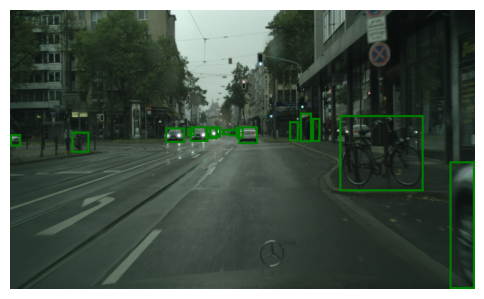

Sample idx=914 | split=train
  Boxes: [[142.54248046875, 347.65625, 161.41796875, 389.0625], [164.67236328125, 345.3125, 181.59521484375, 413.28125], [192.66015625, 342.96875, 209.5830078125, 397.65625], [212.1865234375, 344.53125, 227.8076171875, 398.4375], [285.0849609375, 365.625, 312.421875, 404.6875], [322.18505859375, 366.40625, 343.01318359375, 400.0], [332.59912109375, 367.96875, 350.1728515625, 403.90625], [367.095703125, 309.375, 397.0361328125, 392.96875], [340.40966796875, 308.59375, 375.55712890625, 422.65625], [404.19580078125, 313.28125, 430.23095703125, 414.0625], [384.0185546875, 318.75, 415.91162109375, 424.21875], [436.73974609375, 319.53125, 469.28369140625, 419.53125], [467.98193359375, 313.28125, 501.1767578125, 421.875], [494.66796875, 312.5, 525.25927734375, 420.3125], [413.30810546875, 306.25, 469.9345703125, 332.8125], [671.70703125, 318.75, 695.78955078125, 367.1875], [740.7001953125, 309.375, 769.3388671875, 377.34375], [797.32666015625, 309.375, 819.4565429

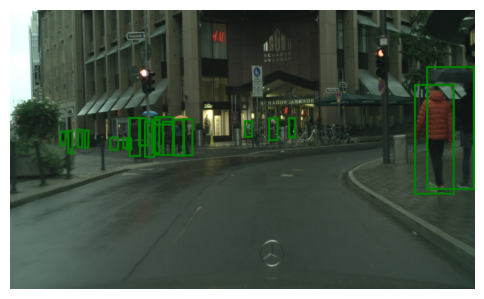

Sample idx=571 | split=train
  Boxes: [[522.65576171875, 360.15625, 531.76806640625, 375.0], [480.3486328125, 359.375, 502.478515625, 378.90625], [492.71533203125, 360.15625, 512.24169921875, 378.90625], [36.44921875, 357.03125, 134.0810546875, 425.78125], [46.86328125, 378.90625, 127.572265625, 428.125], [395.08349609375, 345.3125, 429.580078125, 388.28125], [716.61767578125, 346.09375, 727.6826171875, 371.875], [706.8544921875, 346.09375, 715.31591796875, 373.4375], [725.0791015625, 321.09375, 758.9248046875, 371.875], [734.19140625, 347.65625, 754.36865234375, 375.0], [749.8125, 342.1875, 766.08447265625, 372.65625], [753.06689453125, 338.28125, 784.9599609375, 390.625], [760.87744140625, 335.9375, 799.93017578125, 393.75], [780.40380859375, 328.90625, 827.26708984375, 407.8125], [797.32666015625, 319.53125, 904.07080078125, 414.84375]]


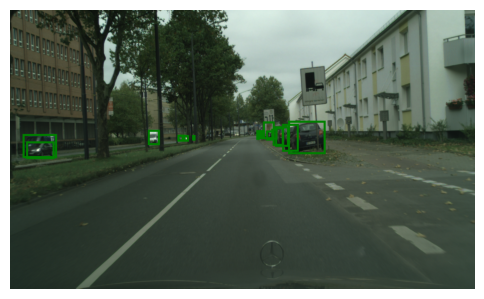

Sample idx=419 | split=train
  Boxes: [[369.04833984375, 308.59375, 379.46240234375, 332.03125], [786.26171875, 351.5625, 805.7880859375, 372.65625], [816.85302734375, 350.78125, 843.5390625, 378.125], [434.787109375, 353.90625, 449.1064453125, 413.28125], [430.8818359375, 317.1875, 455.615234375, 398.4375], [905.37255859375, 353.125, 955.490234375, 387.5], [1046.61328125, 346.875, 1145.546875, 414.0625], [1307.61572265625, 341.40625, 1333.0, 430.46875], [641.7666015625, 329.6875, 753.06689453125, 436.71875], [0.0, 347.65625, 37.7509765625, 406.25], [119.76171875, 314.84375, 448.45556640625, 545.3125]]


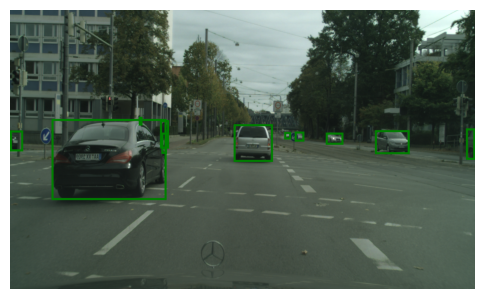

Sample idx=2771 | split=train
  Boxes: [[789.51611328125, 322.65625, 1000.40087890625, 496.09375], [684.07373046875, 330.46875, 763.48095703125, 400.78125], [444.55029296875, 317.1875, 511.5908203125, 413.28125], [280.52880859375, 275.78125, 471.236328125, 485.9375], [65.087890625, 285.15625, 396.38525390625, 576.5625], [0.65087890625, 267.1875, 173.1337890625, 752.34375]]


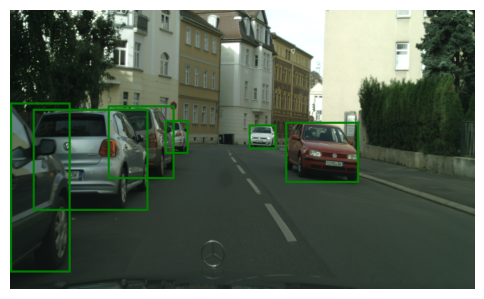

In [16]:
def sanity_check(dataset, num=5, line_width=6):
    """
    Pull `num` random samples, print their box coords, and display with thick green boxes.
    """
    indices = random.sample(range(len(dataset)), num)
    for idx in indices:
        img, target = dataset[idx]
        print(f"Sample idx={idx} | split={dataset.split}")
        print("  Boxes:", target["boxes"].tolist())

        # Denormalize for display
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img_vis = img * std + mean
        img_vis = (img_vis * 255).clamp(0, 255).byte()

        # Draw thicker green GT boxes
        if target["boxes"].numel() > 0:
            boxed = draw_bounding_boxes(
                img_vis, target["boxes"], colors="green", width=line_width
            )
        else:
            boxed = img_vis

        plt.figure(figsize=(6, 4))
        plt.imshow(to_pil_image(boxed))
        plt.axis("off")
        plt.show()

# ▶️ Run with thicker lines
sanity_check(train_dataset_fine, num=5, line_width=6)




### 📄 Dataset Splitting Strategy

We are working with the **Cityscapes `gtFine` annotations** and corresponding **`leftImg8bit` RGB images**. The dataset structure is as follows:

| Subset | Image Count | Purpose                          |
|--------|-------------|----------------------------------|
| `train` | 2,975       | Original training images         |
| `val`   | 500         | Provided validation set          |
| `test`  | N/A         | Annotations not publicly available |

Since the **official `test` annotations are not accessible**, we created a custom internal test set by reserving **10% of the training data (~298 images)**. This allows us to measure how well our model generalizes, without relying on the official test server.

---

### ✅ Final Dataset Split Strategy

| Subset     | Source                  | Usage                                           |
|------------|-------------------------|-------------------------------------------------|
| `train`    | 90% of `gtFine/train`   | Model training using paired `leftImg8bit` images |
| `val`      | `gtFine/val`            | Hyperparameter tuning and validation             |
| `test`     | 10% of `gtFine/train`   | Internal test set to evaluate final performance  |

This approach maintains alignment with best practices in machine learning by holding out unseen data for unbiased evaluation.


### 3.4 Perform the Split

In this step, we carve out an internal 10% test set from the original 2,975 `train` images—while keeping the official `val` split untouched—to simulate held-out evaluation without using the sealed test annotations. By fixing the random seed (`torch.Generator().manual_seed(42)`), we ensure that this 90/10 partition is reproducible across runs. After the split, we relabel both subsets as coming from `"train"` so that downstream code (e.g., data loaders and visualization functions) treats them consistently.

> **Key points**  
> - **Reproducibility** via a fixed seed  
> - **90/10 split**: 2,677 images for fine-tuning, 298 for internal testing  
> - **Tagging** the subsets ensures our logging and plotting utilities remain agnostic to “train vs. held-out” distinction  
> - **Validation** continues to use the official `val` split of 500 images  

This approach maintains a clear separation between fine-tuning, hyperparameter tuning, and final evaluation—aligning with best practices for unbiased model assessment.  



### 3.4 Perform the Split

To simulate a held-out evaluation without using the sealed Cityscapes test annotations, we carve out an **internal test set** from our original training images:

- **Reproducibility**: We fix the random seed (`torch.Generator().manual_seed(42)`) so that the exact same 90/10 split can be recreated in future runs.  
- **90/10 Split**:
  - **Fine-tuning set**: 90% of the 2,975 training images (~2,677 images)  
  - **Internal test set**: 10% of the 2,975 training images (~298 images)  
- **Tagging**: After partitioning, we relabel the two subsets as `"train"` and `"test"` so that all downstream data loaders, transforms, and visualization utilities treat them appropriately.  
- **Official Validation**: The original 500-image Cityscapes `val` split remains unchanged and is used solely for hyperparameter tuning and early stopping.  

This approach maintains a clear separation between model fitting, hyperparameter selection, and final evaluation, ensuring an unbiased assessment of generalization performance.  



In [17]:
# ─── 3.4 Perform the Split ─────────────────────────────────────────────────────

# 📌 1. Fix random seed for reproducibility
generator = torch.Generator().manual_seed(42)

# 📊 2. Compute split sizes: 90% fine-tune / 10% internal test
n_total   = len(train_dataset_fine)
n_test    = int(0.10 * n_total)
n_finetune = n_total - n_test

# ⚖️ 3. Perform the split on the original 'train_dataset_fine'
finetune_dataset, internal_test_dataset = random_split(
    train_dataset_fine,
    [n_finetune, n_test],
    generator=generator
)

# ✅ 4. Tag each for downstream display logic
finetune_dataset.dataset.split     = "train"
internal_test_dataset.dataset.split = "test"

# ✅ 5. Report sizes
print("✅ Final Dataset Splits:")
print(f"   • Fine-tune (train) : {len(finetune_dataset)} images")
print(f"   • Validation        : {len(val_dataset_fine)} images")
print(f"   • Internal test     : {len(internal_test_dataset)} images")



✅ Final Dataset Splits:
   • Fine-tune (train) : 2678 images
   • Validation        : 500 images
   • Internal test     : 297 images


## 4. Model Definition — Faster R-CNN with ResNet-50 FPN

Before training, we construct our detector: **Faster R-CNN** with a **ResNet-50 + Feature Pyramid Network (FPN)** backbone. We’ll initialize from **COCO-pretrained weights** and swap in a new head for our 9 Cityscapes classes.

### 🔍 Why Faster R-CNN?

| Feature                        | Benefit                                                                 |
|--------------------------------|-------------------------------------------------------------------------|
|  Two-Stage Architecture      | Separates region proposals and classification for higher precision.     |
|  Feature Pyramid Network     | Builds multi-scale features to detect small and large objects alike.    |
|  ResNet-50 Backbone          | Proven transfer learning performance when initialized from COCO.        |
|  Easy to Fine-Tune           | Modular head swapping via `FastRCNNPredictor` in `torchvision`.         |

> **Note:** we’ll load the standard COCO v1 weights from `torchvision.models.detection.fasterrcnn_resnet50_fpn` and then replace the box predictor to match **NUM_CLASSES = 9**.




4.1 Define Model Loader Function
This helper encapsulates all the logic for instantiating either a Faster R-CNN or Mask R-CNN backbone, swapping out the head to match our NUM_CLASSES, and optionally freezing the backbone during “head-only” training. By centralizing it here, you can toggle between detection and instance-segmentation with a single flag:

In [18]:
def get_model(num_classes, use_mask_rcnn=False, freeze_backbone=False):
    """
    Returns a COCO-pretrained Faster R-CNN or Mask R-CNN with:
      - head swapped for `num_classes`
      - optionally frozen backbone
    """
    if use_mask_rcnn:
        model = maskrcnn_resnet50_fpn(weights="DEFAULT")
        in_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
        model.roi_heads.mask_predictor = MaskRCNNPredictor(in_feats, 256, num_classes)
    else:
        model = fasterrcnn_resnet50_fpn(weights="DEFAULT")
        in_feats = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_feats, num_classes)

    if freeze_backbone:
        for p in model.backbone.parameters():
            p.requires_grad = False

    return model



### 4.2 Configuration & Hyperparameters

In this cell we centralize all of our “knobs”:

- **Core training**: `NUM_EPOCHS`, `BATCH_SIZE`, `LEARNING_RATE`, `STEP_SIZE`, `LR_GAMMA`, `WEIGHT_DECAY`  
- **Model options**: `NUM_CLASSES`, `USE_MASK_RCNN`, `FREEZE_BACKBONE`, `CONFIDENCE_THRESHOLD`  
- **Data flags**: `USE_SUBSETS`, `TRAIN_SUBSET_SIZE`, `VAL_SUBSET_SIZE`, `TEST_SUBSET_SIZE`  
- **I/O & resume**: `SAVE_PATH`, `LOG_PATH`, `START_EPOCH`  
- **Compute**: `device`, `NUM_WORKERS`

Below is the code that defines all of these globals in one place.


In [19]:
## ─── 4.2 BASE CONFIGURATION ───────────────────────────────────────────────────

# — Model & data
NUM_CLASSES       = 9        # 8 objects + background
USE_MASK_RCNN     = False
FREEZE_BACKBONE   = False

# — Training hyperparameters
NUM_EPOCHS        = 30       # increased for full convergence
BATCH_SIZE        = 2
NUM_WORKERS       = 2

# — Best-cfg hyperparameters (from best_cfg)
HEAD_LR           = 5e-4
BACKBONE_LR       = 0.001
WEIGHT_DECAY      = 0.0001
CONF_THRESHOLD    = 0.05     # use your tuned detection threshold

# — Image resize (COCO defaults)
MIN_SIZE          = 800      # shorter edge
MAX_SIZE          = 1333     # cap on longer edge

# — Scheduler & Metrics
STEP_SIZE             = 10
LR_GAMMA              = 0.8
METRIC_SUMMARY_INTERVAL = 10

# — Subset / resume for fast debug
START_EPOCH       = 1
RESUME_TRAINING   = False
USE_SUBSETS       = False   # disable small-subset hacking for full run

# — I/O and directory structure
from datetime import datetime
import os
import torch

CITYSCAPES_ROOT   = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data"
TIMESTAMP         = datetime.now().strftime("%Y%m%d_%H%M%S")

PRED_DIR          = os.path.join(CITYSCAPES_ROOT, "epoch_predictions")
CHECKPOINT_DIR    = os.path.join(CITYSCAPES_ROOT, "checkpoints")
LOG_DIR           = os.path.join(CITYSCAPES_ROOT, "logs")
SUMMARY_DIR       = os.path.join(LOG_DIR, "summaries")
SAVE_PATH         = os.path.join(CHECKPOINT_DIR, "faster_rcnn_cityscapes_best.pth")
LOG_PATH          = os.path.join(LOG_DIR, f"metrics_log_{TIMESTAMP}.csv")

for d in (PRED_DIR, CHECKPOINT_DIR, LOG_DIR, SUMMARY_DIR):
    os.makedirs(d, exist_ok=True)

# — Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f" Using device: {device}")
if device.type == "cpu":
    print("⚠️ Warning: CUDA device not available — training will be slow.")


 Using device: cuda


## 4.3 Load the COCO-pretrained Model & Set device

In this step we:

- Instantiate our detection model via `get_model(...)`, swapping in `NUM_CLASSES` and optionally freezing the backbone.  
- Move the model onto GPU (if available) or CPU.  
- Set up the optimizer and learning-rate scheduler for training.

In [20]:
### 4.3 Instantiate & Prepare Model, Optimizer, Scheduler

# — 1️⃣ Build model (and freeze backbone if requested)
model = get_model(
    num_classes     = NUM_CLASSES,
    use_mask_rcnn   = USE_MASK_RCNN,
    freeze_backbone = FREEZE_BACKBONE
)

# — 2️⃣ Override the internal post-processing threshold
model.roi_heads.score_thresh = CONF_THRESHOLD
print(f"🛠️  model.roi_heads.score_thresh = {model.roi_heads.score_thresh}")

# — 3️⃣ Sync internal resizing to our transforms (only if you actually resize)
if RESIZE_IMAGES:
    model.transform.min_size = [MIN_SIZE]
    model.transform.max_size = MAX_SIZE
    print(f"🖼️  transform.min_size = {model.transform.min_size}, transform.max_size = {model.transform.max_size}")

# — 4️⃣ Move model ➡ device exactly once
model = model.to(device)
print(f"✅ Model ready on {device}")

# — 5️⃣ Sanity-check your new head’s dimensions
in_feats  = model.roi_heads.box_predictor.cls_score.in_features
out_feats = model.roi_heads.box_predictor.cls_score.out_features
print(f"▶️  box_predictor.cls_score.in_features  = {in_feats}")
print(f"    box_predictor.cls_score.out_features = {out_feats}")

# — 6️⃣ Verify head params are non-zero & trainable
head_w, head_b = model.roi_heads.box_predictor.cls_score.weight, model.roi_heads.box_predictor.cls_score.bias
print(f"🧪  Head ‖w‖ = {head_w.norm().item():.4f}, ‖b‖ = {head_b.norm().item():.4f}")
print(f"    w.requires_grad = {head_w.requires_grad}, b.requires_grad = {head_b.requires_grad}")

# — 7️⃣ Count total trainable parameters
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"🧠  Trainable parameters = {trainable_params:,}")

# — 8️⃣ Set up optimizer with per-group LRs
head_params     = [p for n,p in model.named_parameters() if "box_predictor" in n and p.requires_grad]
backbone_params = [p for n,p in model.named_parameters() if "backbone"      in n and p.requires_grad]
other_params    = [p for n,p in model.named_parameters() if "box_predictor" not in n
                                                           and "backbone" not in n
                                                           and p.requires_grad]

optimizer = AdamW(
    [
        {"params": head_params,     "lr": HEAD_LR},
        {"params": backbone_params, "lr": BACKBONE_LR},
        {"params": other_params,    "lr": HEAD_LR},
    ],
    weight_decay = WEIGHT_DECAY
)

# — 9️⃣ Learning-rate scheduler
lr_scheduler = StepLR(optimizer, step_size=STEP_SIZE, gamma=LR_GAMMA)

print(f"✅ Optimizer (AdamW) — head LR: {HEAD_LR}, backbone LR: {BACKBONE_LR}, wd: {WEIGHT_DECAY}")
print(f"🔁 Scheduler → StepLR(step_size={STEP_SIZE}, gamma={LR_GAMMA})")


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 241MB/s]


🛠️  model.roi_heads.score_thresh = 0.05
✅ Model ready on cuda
▶️  box_predictor.cls_score.in_features  = 1024
    box_predictor.cls_score.out_features = 9
🧪  Head ‖w‖ = 1.7275, ‖b‖ = 0.0533
    w.requires_grad = True, b.requires_grad = True
🧠  Trainable parameters = 41,112,636
✅ Optimizer (AdamW) — head LR: 0.0005, backbone LR: 0.001, wd: 0.0001
🔁 Scheduler → StepLR(step_size=10, gamma=0.8)


## 5 Training & Validation

In this section we bring together:

- **DataLoaders**: build `train_loader`, `val_loader` (and `test_loader`) with our custom `collate_fn` and seeded workers for reproducibility.  
- **Training loop** (`train_one_epoch`):  
  1. Switch to train mode  
  2. For each batch:
     - Move data to `device`
     - Filter out degenerate boxes
     - Compute loss dict (classification, box-regression, RPN)
     - Backpropagate, clip gradients, optimizer step
     - Accumulate and log losses & timings  
  3. Sanity-check that backbone weights updated  
  4. Return average training loss  

- **Validation loop** (`validate`):  
  1. Switch to eval mode  
  2. For each batch:
     - Filter degenerate GT boxes
     - (Optionally) compute validation loss
     - Run inference & filter by `CONFIDENCE_THRESHOLD`
     - Update `MeanAveragePrecision` metric  
  3. Compute COCO-style metrics (`map`, `map_50`, `map_75`, `mar`)  
  4. Return average validation loss & metrics  

- **Epoch orchestration & checkpointing**:  
  - Loop over `NUM_EPOCHS`, calling training and validation  
  - Step LR scheduler after each epoch  
  - If `map_50` improves, save model and a sample prediction image  
  - Log all epoch-level stats for later plotting  





### 5.1 DataLoader Setup

Here we construct PyTorch `DataLoader`s for our train/val/test splits.  
- We use a custom `collate_fn` to bundle variable-sized targets into tuples.  
- We seed each worker for full reproducibility (so shuffling and augmentation are deterministic).  


In [60]:
### 5.1 Dataloaders Setup

# Collate function to handle variable-sized targets (Faster R-CNN requirement)
def collate_fn(batch):
    return tuple(zip(*batch))

# Ensure each worker has a deterministic seed
def seed_worker(worker_id):
    random.seed(42 + worker_id)
    torch.manual_seed(42 + worker_id)

# ▶️ Training loader (90% fine-tune split)
train_loader = DataLoader(
    finetune_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn,
    worker_init_fn=seed_worker
)

# ▶️ Validation loader (official Cityscapes val set)
val_loader = DataLoader(
    val_dataset_fine,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn,
    worker_init_fn=seed_worker
)

# ▶️ Test loader (10% held-out from original train)
test_loader = DataLoader(
    internal_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn,
    worker_init_fn=seed_worker
)

print("✅ DataLoaders for fine-tuning, validation, and internal-test sets created.")




✅ DataLoaders for fine-tuning, validation, and internal-test sets created.


### 5.2 Training for One Epoch

In this step we perform a full pass over the training data to update our model’s weights. The `train_one_epoch` function will:

- **Switch to train mode**: Enables dropout, batch-norm updates, etc.  
- **Loop over each batch**:
  1. Move images and targets to the chosen device (CPU/GPU).  
  2. Remove any degenerate boxes (zero area) from the targets.  
  3. Forward pass through the model to obtain a loss dictionary, containing:
     - `loss_classifier` (head classification)
     - `loss_box_reg` (bounding-box regression)
     - `loss_objectness` (RPN objectness)
     - `loss_rpn_box_reg` (RPN box regression)  
  4. Sum the losses, backpropagate, optionally clip gradients, and perform an optimizer step.  
  5. Accumulate the per-batch loss and track timing.  

- **Sanity-check weight updates**: Compare a snapshot of a backbone weight tensor before/after training to ensure it changed.  
- **Return** the average training loss for the epoch, which will be logged and later plotted.


In [61]:
# ─── Training Loop Configuration ────────────────────────────────────────────────
PRINT_LOSSES = False           # Set to True to print every loss term per batch
CLEANUP_INTERVAL = 20          # Batches between memory cleanups
CLIP_GRAD_NORM = 1.0           # Max norm for gradient clipping

def train_one_epoch(model, optimizer, data_loader, device, epoch):
    model.train()
    total_loss = 0.0
    batch_times = []

    init_weight = model.backbone.body.layer4[0].conv1.weight.detach().clone()

    pbar = tqdm(enumerate(data_loader), total=len(data_loader), desc=f"Epoch {epoch} Training", leave=True)

    for i, (images, targets) in pbar:
        start = time.time()

        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        for t in targets:
            boxes = t["boxes"]
            keep = (boxes[:, 2] > boxes[:, 0]) & (boxes[:, 3] > boxes[:, 1])
            t["boxes"], t["labels"] = boxes[keep], t["labels"][keep]

        if sum(len(t["boxes"]) for t in targets) == 0:
            pbar.write(f"⚠️ Skipping batch {i} (no GT boxes)")
            continue

        try:
            loss_dict = model(images, targets)
            loss = sum(loss_dict.values())

            if PRINT_LOSSES:
                for name, val in loss_dict.items():
                    pbar.write(f"    {name}: {val.item():.4f}")

            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), CLIP_GRAD_NORM)
            optimizer.step()

        except Exception as e:
            pbar.write(f"❌ Batch {i} failed ({type(e).__name__}): {e}")
            continue

        total_loss += loss.item()
        batch_time = time.time() - start
        batch_times.append(batch_time)

        pbar.set_postfix({
            "Batch": f"{i+1}/{len(data_loader)}",
            "Loss": f"{loss.item():.3f}",
            "Avg Loss": f"{total_loss / (i + 1):.3f}",
            "Time (s)": f"{batch_time:.2f}"
        })

        if (i + 1) % CLEANUP_INTERVAL == 0:
            gc.collect()
            if device.type == "cuda":
                torch.cuda.empty_cache()
            pbar.write(f"🧹 Cleaned memory at batch {i + 1}")

    updated_weight = model.backbone.body.layer4[0].conv1.weight
    if torch.equal(init_weight, updated_weight):
        pbar.write("❌ Backbone weights did NOT change! Check frozen layers or optimizer.")
    else:
        pbar.write("✅ Backbone weights updated successfully.")

    avg_loss = total_loss / max(len(batch_times), 1)
    avg_batch_time = sum(batch_times) / max(len(batch_times), 1)

    pbar.write(f"\n✅ Epoch {epoch} Summary — Avg Loss: {avg_loss:.4f}, Avg Batch Time: {avg_batch_time:.2f}s\n")

    return avg_loss, avg_batch_time


### 5.3 Validation Loop & mAP Computation

In this step, we switch the model to evaluation mode and iterate over the validation (or test) loader to:

1. **Filter out degenerate ground-truth boxes** (width/height ≤ 0)  
2. **Optionally compute the validation loss** by briefly toggling into train mode  
3. **Run inference** to get predicted boxes, scores, and labels  
4. **Filter predictions** by our `CONFIDENCE_THRESHOLD`  
5. **Accumulate COCO-style metrics** (mAP@[.50:.95], mAP@.50, mAP@.75, mAR) via `torchmetrics.detection.MeanAveragePrecision`  

We fall back gracefully if the installed `torchmetrics` version doesn’t support the `detection_threshold` argument. At the end, we print a summary of all key metrics.



In [62]:

from torchmetrics.detection.mean_ap import MeanAveragePrecision
import torch
from tqdm.notebook import tqdm
import os

def validate(
    model,
    data_loader,
    device,
    conf_threshold: float = CONF_THRESHOLD,
    is_test: bool = False,
    save_dir: str = None,
    epoch: int = None
):
    """
    Run inference on the validation or test set and compute COCO-style mAP metrics.
    - conf_threshold: score cutoff for filtering predictions.
    - If save_dir and epoch are provided, saves one sample pred/GT image per-epoch.
    """
    model.eval()
    tag = "TEST" if is_test else "VALIDATION"
    # Properly centered header
    print()
    print(f"🔍 {tag} Loop".center(60, "="))

    metric = MeanAveragePrecision(iou_type="bbox")
    total_loss, valid_batches = 0.0, 0

    # placeholders for first‐batch sample
    sample_img, sample_tgt, sample_pred = None, None, None

    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(tqdm(data_loader, desc=f"{tag} Batches")):
            imgs = [img.to(device) for img in images]
            tgts = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # filter degenerate GTs
            for t in tgts:
                boxes = t["boxes"]
                keep  = (boxes[:,2] > boxes[:,0]) & (boxes[:,3] > boxes[:,1])
                t["boxes"], t["labels"] = boxes[keep], t["labels"][keep]
            if all(len(t["boxes"]) == 0 for t in tgts):
                continue

            # compute validation loss
            model.train()
            loss_dict = model(imgs, tgts)
            total_loss += sum(loss_dict.values()).item()
            valid_batches += 1
            model.eval()

            # inference + threshold‐filter
            outputs = model(imgs)
            filtered = []
            for out in outputs:
                keep = out["scores"] >= conf_threshold
                filtered.append({
                    "boxes":  out["boxes"][keep],
                    "labels": out["labels"][keep],
                    "scores": out["scores"][keep],
                })

            # capture the first sample for per-epoch visualization
            if batch_idx == 0 and save_dir and (epoch is not None):
                sample_img  = images[0]
                sample_tgt  = targets[0]
                sample_pred = filtered[0]

            metric.update(filtered, tgts)

    stats    = metric.compute()
    avg_loss = total_loss / max(valid_batches, 1)

    # pull out all the maps
    map50_95 = stats.get("map_50_95", stats.get("map", torch.tensor(0.0))).item()
    map50    = stats.get("map_50",     torch.tensor(0.0)).item()
    map75    = stats.get("map_75",     torch.tensor(0.0)).item()

    # fallback to mar_100 if no 'mar'
    mar      = stats.get("mar",        stats.get("mar_100", torch.tensor(0.0))).item()

    print(f"\n📊 {tag} Results:")
    print(f"   • Avg Loss      : {avg_loss: .4f}")
    print(f"   • mAP@[.50:.95] : {map50_95: .4f}")
    print(f"   • mAP@.50       : {map50: .4f}")
    print(f"   • mAP@.75       : {map75: .4f}")
    print(f"   • mAR           : {mar: .4f}")

    # save the first-sample pred/GT image for this epoch, if requested
    if save_dir and (epoch is not None) and sample_img is not None:
        save_prediction_and_ground_truth_image(
            sample_img,
            sample_pred,
            sample_tgt,
            epoch,
            output_dir=save_dir
        )

    return avg_loss, stats




## 6 Training Loop & Checkpointing

In this section, we orchestrate the full training workflow by bringing together our model, data loaders, training and validation functions, and learning-rate scheduler. We also implement checkpointing to save the best model based on validation performance.

### 🔁 Epoch Loop
For each epoch:
1. **Training**  
   - Call `train_one_epoch()` to run forward/backward passes on the training set  
   - Log the average training loss and batch timing  
2. **Validation**  
   - Call `validate()` to compute COCO-style mAP metrics on the validation set  
   - Log validation loss, mAP@.50, mAP@.75, mAP@[.50:.95], and mAR  
3. **LR Scheduling**  
   - Step the `StepLR` scheduler to decay learning rate at predefined intervals  
4. **Checkpointing**  
   - If validation mAP@.50 improves over the best seen so far, save model weights  
   - (Optionally) save a sample prediction image for qualitative inspection  

### ✅ Logging & Visualization
- Accumulate per-epoch metrics in a list or DataFrame  
- After training, plot curves for training loss, validation loss, and all mAP/recall metrics  
- Save a CSV log of epoch metrics for reproducibility and reporting  



### 6.1 Image-Saving Function

In order to visually inspect how our model’s predictions evolve over training, we define a helper that:

1. **Filters** the predicted boxes by a confidence threshold.  
2. **Denormalizes** and clamps the image tensor to valid pixel values.  
3. **Draws** bounding boxes (with scores) on the image.  
4. **Saves** the result to disk under a timestamped filename for later review.  

You can call this function after any epoch (e.g. on your validation set) to archive example outputs alongside your logs.


In [63]:


def save_prediction_and_ground_truth_image(img_tensor, prediction, target, epoch, output_dir=None, threshold=CONF_THRESHOLD, suffix=""):
    """
    Saves both the predicted and ground truth bounding boxes for a single image.

    Args:
        img_tensor (Tensor[3,H,W]): Normalized image tensor (usually on GPU)
        prediction (dict): Output from model (boxes, labels, scores)
        target (dict): Ground truth with "boxes" and "labels"
        epoch (int): Epoch number (used in filename)
        output_dir (str): Where to save. Defaults to CITYSCAPES_ROOT/epoch_predictions
        threshold (float): Score threshold for filtering predictions
        suffix (str): Optional suffix to append to filenames (e.g., "debug")
    """
    if output_dir is None:
        output_dir = os.path.join(CITYSCAPES_ROOT, "epoch_predictions")
    os.makedirs(output_dir, exist_ok=True)

    # ✅ Make sure mean and std are on same device as image tensor
    mean = torch.tensor([0.485, 0.456, 0.406], device=img_tensor.device).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=img_tensor.device).view(3, 1, 1)

    img_vis = img_tensor * std + mean
    img_vis = (img_vis * 255).clamp(0, 255).to(torch.uint8).cpu()

    suffix_str = f"_{suffix}" if suffix else ""

    # ————— Prediction —————
    keep = prediction["scores"] >= threshold
    boxes_pred = prediction["boxes"][keep]
    labels_pred = [f"{s:.2f}" for s in prediction["scores"][keep]]

    if boxes_pred.numel() > 0:
        annotated_pred = draw_bounding_boxes(
            img_vis.clone(),
            boxes_pred.cpu(),
            labels=labels_pred,
            colors="red",
            width=3,
            font_size=16
        )
        pred_path = os.path.join(output_dir, f"pred_epoch_{epoch}{suffix_str}.png")
        to_pil_image(annotated_pred).save(pred_path)
        print(f"📸 Saved prediction image → {pred_path}")
    else:
        print(f"[Epoch {epoch}] No predictions ≥ {threshold:.2f}")

    # ————— Ground Truth —————
    boxes_gt = target["boxes"]
    labels_gt = [str(CLASS_NAMES.get(int(l), l)) for l in target["labels"]]

    if boxes_gt.numel() > 0:
        annotated_gt = draw_bounding_boxes(
            img_vis.clone(),
            boxes_gt.cpu(),
            labels=labels_gt,
            colors="green",
            width=3,
            font_size=16
        )
        gt_path = os.path.join(output_dir, f"gt_epoch_{epoch}{suffix_str}.png")
        to_pil_image(annotated_gt).save(gt_path)
        print(f"📸 Saved ground truth image → {gt_path}")
    else:
        print(f"[Epoch {epoch}] No GT boxes to visualize")


### 6.2 Hyperparameter Grid-Search Results

> 🔢 **Total configs to try:** 162  
> 📦 **Loaded images:** 2975 train, 500 val  

Below is a condensed log of each configuration’s 10-epoch overfit sanity mAP@.50 performance (train loss omitted for brevity):

▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0, 'unfreeze':'layer4+fpn', 'thr':0.0} → mAP@.50 = 0.002
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0, 'unfreeze':'layer4+fpn', 'thr':0.05} → mAP@.50 = 0.002
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0, 'unfreeze':'layer4+fpn', 'thr':0.1} → mAP@.50 = 0.001

▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0, 'unfreeze':'full', 'thr':0.0} → mAP@.50 = 0.115
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0, 'unfreeze':'full', 'thr':0.05} → mAP@.50 = 0.104
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0, 'unfreeze':'full', 'thr':0.1} → mAP@.50 = 0.104

▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0001, 'unfreeze':'layer4+fpn', 'thr':0.0} → mAP@.50 = 0.005
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0001, 'unfreeze':'full', 'thr':0.0} → mAP@.50 = 0.123
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0001, 'unfreeze':'full', 'thr':0.05} → mAP@.50 = 0.126
▶▶ cfg: {'head_lr':0.01, 'backbone_lr':0.001, 'wd':0.0001, 'unfreeze':'full', 'thr':0.1} → mAP@.50 = 0.118

… [additional lower-performing configs omitted] …

best_cfg = {
    "head_lr":     0.01,
    "backbone_lr": 0.001,
    "wd":          0.0001,
    "unfreeze":    "full",
    "thr":         0.05
}
best_mAP50 = 0.126


### 6.3 Main Training Loop & Checkpointing

In [64]:


def summarize_metrics(df, epoch, interval=10, save_dir=None, pred_img_path=None, gt_img_path=None):
    """
    Print and plot training/validation metrics every N epochs, show images and model summary.
    """
    # — Tabular summary with forced four decimals —
    display_cols = ["epoch", "train_loss", "val_loss", "map_50", "map_75", "map", "mar"]
    if "map_25" in df.columns:
        display_cols.insert(4, "map_25")

    sub = df[display_cols].tail(interval if epoch >= interval else epoch)
    fmt = {c: "{:,.4f}".format for c in display_cols if c != "epoch"}

    print(f"\n📊 Epoch Summary (every {interval} epochs or final):")
    print(sub.to_string(index=False, formatters=fmt))

    # — Top-5 by mAP@.50 —
    top5 = (df.sort_values("map_50", ascending=False)
              [["epoch", "map_50", "map", "mar"]]
              .head(5))
    print("\n🏆 Top 5 Epochs by mAP@.50:")
    print(top5.to_string(index=False, formatters=fmt))

    # — Plots in a 2×3 grid —
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    axs = axs.flatten()

    # 1) Loss
    axs[0].plot(df["epoch"], df["train_loss"], label="Train")
    axs[0].plot(df["epoch"], df["val_loss"],   label="Val")
    axs[0].set_title("Loss over Epochs")
    axs[0].legend(); axs[0].grid(True)

    # 2) Precision (mAP)
    axs[1].plot(df["epoch"], df["map_50"], label="mAP@.50")
    axs[1].plot(df["epoch"], df["map_75"], label="mAP@.75")
    axs[1].plot(df["epoch"], df["map"],     label="mAP@[.50:.95]")
    if "map_25" in df.columns:
        axs[1].plot(df["epoch"], df["map_25"], label="mAP@.25")
    axs[1].set_title("Precision (mAP)")
    axs[1].legend(); axs[1].grid(True)

    # 3) Recall
    recall_keys = [k for k in ("mar_1", "mar_10", "mar_100") if k in df.columns]
    if recall_keys:
        for k in recall_keys:
            axs[2].plot(df["epoch"], df[k], label=k)
        axs[2].set_title("Recall Metrics")
        axs[2].legend(); axs[2].grid(True)
    else:
        axs[2].axis("off")

    # 4) AP by object scale
    scale_keys = [k for k in ("map_small", "map_medium", "map_large") if k in df.columns]
    if scale_keys:
        for k in scale_keys:
            axs[3].plot(df["epoch"], df[k], label=k.replace("map_", "AP "))
        axs[3].set_title("AP by Object Scale")
        axs[3].legend(); axs[3].grid(True)
    else:
        axs[3].axis("off")

    # 5) Time per epoch
    axs[4].plot(df["epoch"], df["time"], label="Time/epoch")
    axs[4].set_title("Time per Epoch")
    axs[4].legend(); axs[4].grid(True)

    # 6) reserved
    axs[5].axis("off")

    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        fig.savefig(os.path.join(save_dir, f"metrics_epoch_{epoch}.png"))
    plt.show()

    # — This epoch’s GT vs Prediction —
    if pred_img_path and gt_img_path and os.path.exists(pred_img_path) and os.path.exists(gt_img_path):
        print(f"\n🖼️ EPOCH {epoch} — GT (green) vs Prediction (red)")
        print("Ground Truth:"); display(IPyImage(gt_img_path))
        print("Prediction:");    display(IPyImage(pred_img_path))

    # — Model summary —
    total_p = sum(p.numel() for p in model.parameters())
    train_p = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"\n🧠 Model Summary\n   • Total params    : {total_p:,}\n   • Trainable params: {train_p:,}")




🔧 Configuration Summary
  • Model type        : Faster R-CNN
  • Num classes       : 9
  • Freeze backbone   : False
  • Total params      : 41,335,036
  • Trainable params  : 41,112,636
  • Device            : cuda
  • Epochs            : 30
  • Batch size        : 2
  • Num workers       : 2
  • Learning rates    : head=0.0005, backbone=0.001
  • Weight decay      : 0.0001
  • LR scheduler      : StepLR(step_size=10, gamma=0.8)
  • Resize images     : False
  • Using subsets     : False
  • Output directories:
    – Predictions   : /content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/epoch_predictions
    – Checkpoints   : /content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/checkpoints
    – Logs          : /content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/logs/metrics_log_20250424_124721.csv
    – Summaries     : /content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/logs/summaries

📄 Starting new training run from epoch 

Epoch 1 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.4271
   • mAP@[.50:.95] :  0.0450
   • mAP@.50       :  0.1171
   • mAP@.75       :  0.0273
   • mAR           :  0.1008


Epoch 2 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.3315
   • mAP@[.50:.95] :  0.0841
   • mAP@.50       :  0.2014
   • mAP@.75       :  0.0548
   • mAR           :  0.1727


Epoch 3 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2567
   • mAP@[.50:.95] :  0.1005
   • mAP@.50       :  0.2389
   • mAP@.75       :  0.0674
   • mAR           :  0.1989


Epoch 4 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2660
   • mAP@[.50:.95] :  0.1134
   • mAP@.50       :  0.2603
   • mAP@.75       :  0.0799
   • mAR           :  0.2316


Epoch 5 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2331
   • mAP@[.50:.95] :  0.1144
   • mAP@.50       :  0.2583
   • mAP@.75       :  0.0853
   • mAR           :  0.2263


Epoch 6 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2664
   • mAP@[.50:.95] :  0.1264
   • mAP@.50       :  0.2929
   • mAP@.75       :  0.0963
   • mAR           :  0.2452


Epoch 7 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2205
   • mAP@[.50:.95] :  0.1195
   • mAP@.50       :  0.2733
   • mAP@.75       :  0.0827
   • mAR           :  0.2466


Epoch 8 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1926
   • mAP@[.50:.95] :  0.1271
   • mAP@.50       :  0.2890
   • mAP@.75       :  0.0892
   • mAR           :  0.2596


Epoch 9 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2489
   • mAP@[.50:.95] :  0.1187
   • mAP@.50       :  0.2727
   • mAP@.75       :  0.0811
   • mAR           :  0.2592


Epoch 10 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.2871
   • mAP@[.50:.95] :  0.1161
   • mAP@.50       :  0.2676
   • mAP@.75       :  0.0809
   • mAR           :  0.2578

📊 Epoch Summary (every 10 epochs or final):
 epoch train_loss val_loss map_50 map_75    map    mar
     1     1.4428   1.4271 0.1171 0.0273 0.0450 0.0000
     2     1.2180   1.3315 0.2014 0.0548 0.0841 0.0000
     3     1.1568   1.2567 0.2389 0.0674 0.1005 0.0000
     4     1.1258   1.2660 0.2603 0.0799 0.1134 0.0000
     5     1.0898   1.2331 0.2583 0.0853 0.1144 0.0000
     6     1.0836   1.2664 0.2929 0.0963 0.1264 0.0000
     7     1.0617   1.2205 0.2733 0.0827 0.1195 0.0000
     8     1.0516   1.1926 0.2890 0.0892 0.1271 0.0000
     9     1.0380   1.2489 0.2727 0.0811 0.1187 0.0000
    10     1.0310   1.2871 0.2676 0.0809 0.1161 0.0000

🏆 Top 5 Epochs by mAP@.50:
 epoch map_50    map    mar
     6 0.2929 0.1264 0.0000
     8 0.2890 0.1271 0.0000
     7 0.2733 0.1195 0.0000
     9 0.2727 0.1187 0.0000
    10 0.2676 

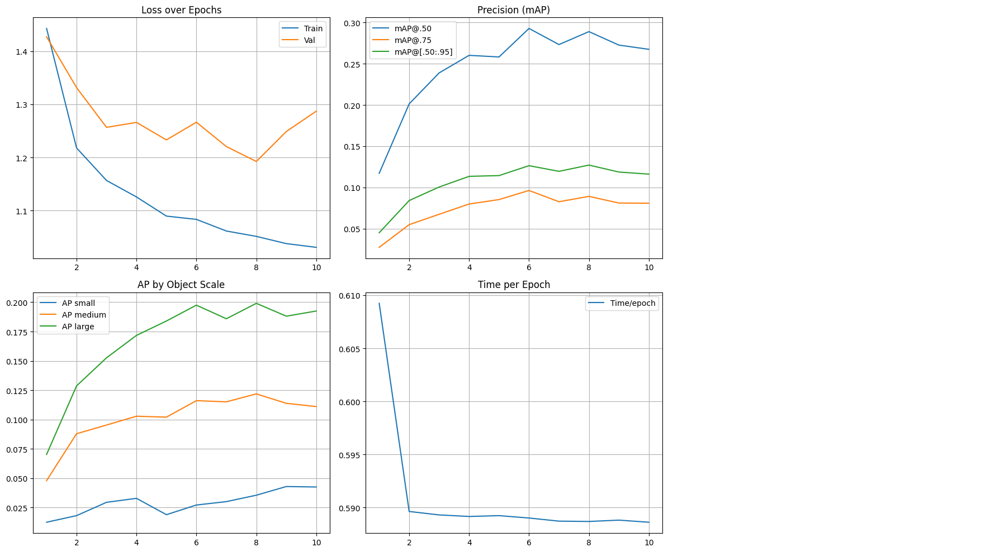


🧠 Model Summary
   • Total params    : 41,335,036
   • Trainable params: 41,112,636


Epoch 11 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1710
   • mAP@[.50:.95] :  0.1384
   • mAP@.50       :  0.3051
   • mAP@.75       :  0.1018
   • mAR           :  0.2650


Epoch 12 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1835
   • mAP@[.50:.95] :  0.1464
   • mAP@.50       :  0.3225
   • mAP@.75       :  0.1104
   • mAR           :  0.2917


Epoch 13 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1740
   • mAP@[.50:.95] :  0.1458
   • mAP@.50       :  0.3173
   • mAP@.75       :  0.1099
   • mAR           :  0.2801


Epoch 14 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1701
   • mAP@[.50:.95] :  0.1422
   • mAP@.50       :  0.3064
   • mAP@.75       :  0.1162
   • mAR           :  0.2835


Epoch 15 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1816
   • mAP@[.50:.95] :  0.1394
   • mAP@.50       :  0.3219
   • mAP@.75       :  0.0928
   • mAR           :  0.2684


Epoch 16 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1535
   • mAP@[.50:.95] :  0.1517
   • mAP@.50       :  0.3308
   • mAP@.75       :  0.1149
   • mAR           :  0.2754


Epoch 17 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1445
   • mAP@[.50:.95] :  0.1500
   • mAP@.50       :  0.3267
   • mAP@.75       :  0.1141
   • mAR           :  0.2919


Epoch 18 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1654
   • mAP@[.50:.95] :  0.1584
   • mAP@.50       :  0.3335
   • mAP@.75       :  0.1306
   • mAR           :  0.2804


Epoch 19 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1430
   • mAP@[.50:.95] :  0.1606
   • mAP@.50       :  0.3383
   • mAP@.75       :  0.1333
   • mAR           :  0.2894


Epoch 20 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1545
   • mAP@[.50:.95] :  0.1558
   • mAP@.50       :  0.3342
   • mAP@.75       :  0.1228
   • mAR           :  0.2759

📊 Epoch Summary (every 10 epochs or final):
 epoch train_loss val_loss map_50 map_75    map    mar
    11     1.0035   1.1710 0.3051 0.1018 0.1384 0.0000
    12     0.9951   1.1835 0.3225 0.1104 0.1464 0.0000
    13     0.9799   1.1740 0.3173 0.1099 0.1458 0.0000
    14     0.9799   1.1701 0.3064 0.1162 0.1422 0.0000
    15     0.9771   1.1816 0.3219 0.0928 0.1394 0.0000
    16     0.9700   1.1535 0.3308 0.1149 0.1517 0.0000
    17     0.9673   1.1445 0.3267 0.1141 0.1500 0.0000
    18     0.9660   1.1654 0.3335 0.1306 0.1584 0.0000
    19     0.9655   1.1430 0.3383 0.1333 0.1606 0.0000
    20     0.9972   1.1545 0.3342 0.1228 0.1558 0.0000

🏆 Top 5 Epochs by mAP@.50:
 epoch map_50    map    mar
    19 0.3383 0.1606 0.0000
    20 0.3342 0.1558 0.0000
    18 0.3335 0.1584 0.0000
    16 0.3308 0.1517 0.0000
    17 0.3267 

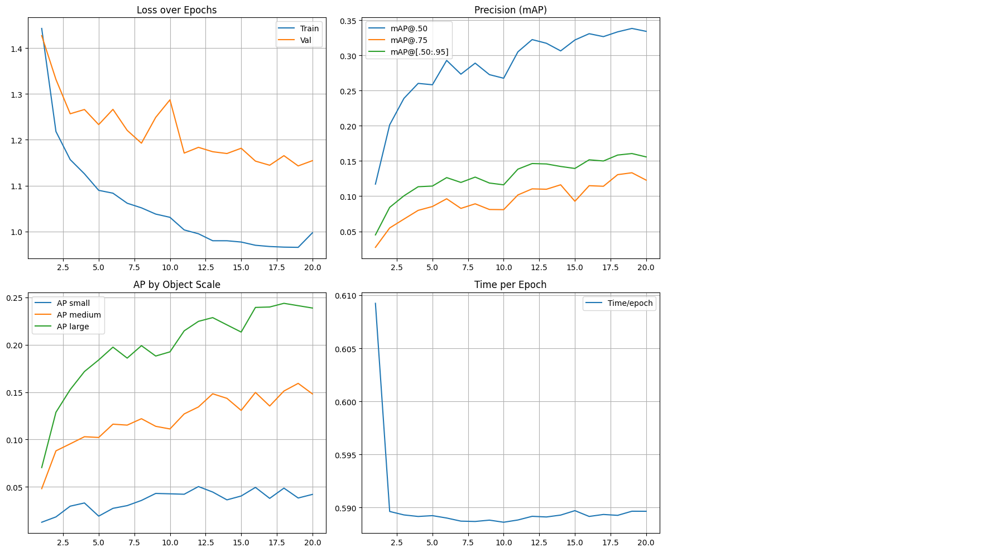


🧠 Model Summary
   • Total params    : 41,335,036
   • Trainable params: 41,112,636


Epoch 21 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1339
   • mAP@[.50:.95] :  0.1678
   • mAP@.50       :  0.3655
   • mAP@.75       :  0.1240
   • mAR           :  0.2971


Epoch 22 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1547
   • mAP@[.50:.95] :  0.1564
   • mAP@.50       :  0.3365
   • mAP@.75       :  0.1216
   • mAR           :  0.2885


Epoch 23 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1200
   • mAP@[.50:.95] :  0.1791
   • mAP@.50       :  0.3749
   • mAP@.75       :  0.1475
   • mAR           :  0.3028


Epoch 24 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.0984
   • mAP@[.50:.95] :  0.1566
   • mAP@.50       :  0.3365
   • mAP@.75       :  0.1230
   • mAR           :  0.2935


Epoch 25 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1302
   • mAP@[.50:.95] :  0.1678
   • mAP@.50       :  0.3520
   • mAP@.75       :  0.1329
   • mAR           :  0.3130


Epoch 26 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1081
   • mAP@[.50:.95] :  0.1754
   • mAP@.50       :  0.3668
   • mAP@.75       :  0.1368
   • mAR           :  0.3088


Epoch 27 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1515
   • mAP@[.50:.95] :  0.1581
   • mAP@.50       :  0.3458
   • mAP@.75       :  0.1159
   • mAR           :  0.2969


Epoch 28 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1130
   • mAP@[.50:.95] :  0.1784
   • mAP@.50       :  0.3700
   • mAP@.75       :  0.1495
   • mAR           :  0.3077


Epoch 29 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1464
   • mAP@[.50:.95] :  0.1653
   • mAP@.50       :  0.3518
   • mAP@.75       :  0.1283
   • mAR           :  0.3043


Epoch 30 Training:   0%|          | 0/1339 [00:00<?, ?it/s]

🧹 Cleaned memory at batch 20
🧹 Cleaned memory at batch 40
🧹 Cleaned memory at batch 60
🧹 Cleaned memory at batch 80
🧹 Cleaned memory at batch 100
🧹 Cleaned memory at batch 120
🧹 Cleaned memory at batch 140
🧹 Cleaned memory at batch 160
🧹 Cleaned memory at batch 180
🧹 Cleaned memory at batch 200
🧹 Cleaned memory at batch 220
🧹 Cleaned memory at batch 240
🧹 Cleaned memory at batch 260
🧹 Cleaned memory at batch 280
🧹 Cleaned memory at batch 300
🧹 Cleaned memory at batch 320
🧹 Cleaned memory at batch 340
🧹 Cleaned memory at batch 360
🧹 Cleaned memory at batch 380
🧹 Cleaned memory at batch 400
🧹 Cleaned memory at batch 420
🧹 Cleaned memory at batch 440
🧹 Cleaned memory at batch 460
🧹 Cleaned memory at batch 480
🧹 Cleaned memory at batch 500
🧹 Cleaned memory at batch 520
🧹 Cleaned memory at batch 540
🧹 Cleaned memory at batch 560
🧹 Cleaned memory at batch 580
🧹 Cleaned memory at batch 600
🧹 Cleaned memory at batch 620
🧹 Cleaned memory at batch 640
🧹 Cleaned memory at batch 660
🧹 Cleaned memo

VALIDATION Batches:   0%|          | 0/250 [00:00<?, ?it/s]


📊 VALIDATION Results:
   • Avg Loss      :  1.1272
   • mAP@[.50:.95] :  0.1799
   • mAP@.50       :  0.3726
   • mAP@.75       :  0.1454
   • mAR           :  0.3171

📊 Epoch Summary (every 10 epochs or final):
 epoch train_loss val_loss map_50 map_75    map    mar
    21     0.9337   1.1339 0.3655 0.1240 0.1678 0.0000
    22     0.9222   1.1547 0.3365 0.1216 0.1564 0.0000
    23     0.9137   1.1200 0.3749 0.1475 0.1791 0.0000
    24     0.9131   1.0984 0.3365 0.1230 0.1566 0.0000
    25     0.9122   1.1302 0.3520 0.1329 0.1678 0.0000
    26     0.9092   1.1081 0.3668 0.1368 0.1754 0.0000
    27     0.9052   1.1515 0.3458 0.1159 0.1581 0.0000
    28     0.9048   1.1130 0.3700 0.1495 0.1784 0.0000
    29     0.8999   1.1464 0.3518 0.1283 0.1653 0.0000
    30     0.8962   1.1272 0.3726 0.1454 0.1799 0.0000

🏆 Top 5 Epochs by mAP@.50:
 epoch map_50    map    mar
    23 0.3749 0.1791 0.0000
    30 0.3726 0.1799 0.0000
    28 0.3700 0.1784 0.0000
    26 0.3668 0.1754 0.0000
    21 0.3655 

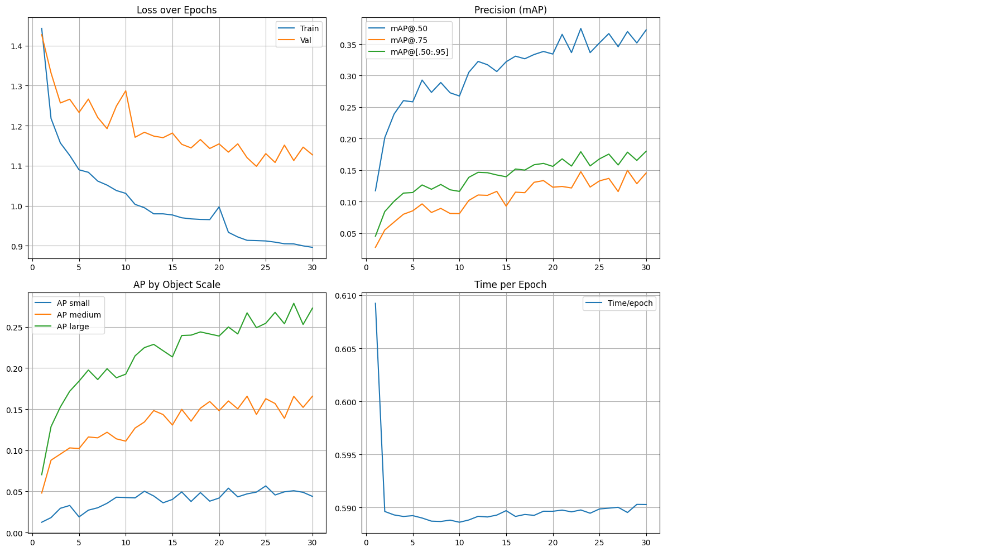


🧠 Model Summary
   • Total params    : 41,335,036
   • Trainable params: 41,112,636

🏆 Overall best mAP@.50: 0.3749


In [65]:
# 🛠 Configuration Summary
print("🔧 Configuration Summary")
print(f"  • Model type        : {'Mask R-CNN' if USE_MASK_RCNN else 'Faster R-CNN'}")
print(f"  • Num classes       : {NUM_CLASSES}")
print(f"  • Freeze backbone   : {FREEZE_BACKBONE}")
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"  • Total params      : {total_params:,}")
print(f"  • Trainable params  : {trainable_params:,}")
print(f"  • Device            : {device}")
print(f"  • Epochs            : {NUM_EPOCHS}")
print(f"  • Batch size        : {BATCH_SIZE}")
print(f"  • Num workers       : {NUM_WORKERS}")
print(f"  • Learning rates    : head={HEAD_LR}, backbone={BACKBONE_LR}")
print(f"  • Weight decay      : {WEIGHT_DECAY}")
print(f"  • LR scheduler      : StepLR(step_size={STEP_SIZE}, gamma={LR_GAMMA})")
print(f"  • Resize images     : {RESIZE_IMAGES}")
if RESIZE_IMAGES:
    print(f"    – min_size={MIN_SIZE}, max_size={MAX_SIZE}")
print(f"  • Using subsets     : {USE_SUBSETS}")
if USE_SUBSETS:
    print(f"    – train subset size: {len(finetune_dataset)}")
    print(f"    – val   subset size: {len(val_dataset_fine)}")
    print(f"    – test  subset size: {len(internal_test_dataset)}")
print(f"  • Output directories:")
print(f"    – Predictions   : {PRED_DIR}")
print(f"    – Checkpoints   : {CHECKPOINT_DIR}")
print(f"    – Logs          : {LOG_PATH}")
print(f"    – Summaries     : {SUMMARY_DIR}")
print()

# 🏋️‍♂️ Full Training Loop

RESUME_TRAINING = False

# Setup for resuming
epoch_logs   = []
best_map_50  = 0.0
resume_epoch = 1

if RESUME_TRAINING and os.path.exists(LOG_PATH):
    df_prev = pd.read_csv(LOG_PATH)
    if not df_prev.empty:
        epoch_logs   = df_prev.to_dict(orient="records")
        best_map_50  = max(e["map_50"] for e in epoch_logs)
        resume_epoch = max(e["epoch"]   for e in epoch_logs) + 1
        model.load_state_dict(torch.load(SAVE_PATH))
        print(f"🔄 Resuming from epoch {resume_epoch} — best mAP@.50 = {best_map_50:.4f}")
    else:
        print("📄 Log exists but empty. Starting from scratch.")
else:
    print("📄 Starting new training run from epoch 1.")

for epoch in range(resume_epoch, NUM_EPOCHS + 1):
    train_loss, avg_batch_time = train_one_epoch(model, optimizer, train_loader, device, epoch)
    val_loss, val_metrics      = validate(model, val_loader, device)

    # extract per-class AP & Recall
    per_class_ap  = safe_list("map_per_class")
    per_class_rec = safe_list("mar_100_per_class")

    # Build the log entry
    epoch_log = {
        "epoch":         epoch,
        "train_loss":    train_loss,
        "val_loss":      val_loss,
        "map":           float(val_metrics.get("map",   0.0)),
        "map_50":        float(val_metrics.get("map_50",0.0)),
        "map_75":        float(val_metrics.get("map_75",0.0)),
        "mar":           float(val_metrics.get("mar",   0.0)),
        "per_class_ap":  per_class_ap,
        "per_class_rec": per_class_rec,
        "time":          avg_batch_time
    }

    # include small/medium/large and optional map_25
    for extra in ("map_small","map_medium","map_large","map_25"):
        if extra in val_metrics:
            epoch_log[extra] = float(val_metrics[extra])

    epoch_logs.append(epoch_log)

    # checkpoint best model (quietly)
    if epoch_log["map_50"] > best_map_50:
        best_map_50 = epoch_log["map_50"]
        torch.save(model.state_dict(), SAVE_PATH)

    # every interval or last epoch → summarize & log (no in-loop image display)
    if epoch % METRIC_SUMMARY_INTERVAL == 0 or epoch == NUM_EPOCHS:
        df_log = pd.DataFrame(epoch_logs)
        summarize_metrics(
            df_log,
            epoch,
            interval=METRIC_SUMMARY_INTERVAL,
            save_dir=SUMMARY_DIR   # only save summaries and plots
        )
        df_log.to_csv(LOG_PATH, index=False)

    lr_scheduler.step()

print(f"\n🏆 Overall best mAP@.50: {best_map_50:.4f}")



## 🔧 Configuration Summary

- **Model type**  
  Faster R-CNN is a two-stage detector: it first proposes candidate regions, then classifies and refines box coordinates.

- **Num classes**  
  We predict 8 Cityscapes object categories (e.g. person, car, bus, …) + 1 background → **9 total**.

- **Freeze backbone**  
  `False` → we fine-tune all ResNet-50 + FPN weights (not just the new detection head).

- **Total params / Trainable params**  
  Total number of weights in the network vs. how many are updated during training.

- **Device**  
  Training ran on **CUDA** (GPU) for speed.

- **Epochs**  
  Full passes over the **2,678** training images.

- **Batch size**  
  2 images per forward/backward update (limited by GPU memory).

- **Num workers**  
  2 parallel data-loading processes.

- **Learning rates**  
  – head = 5 × 10⁻⁴ for the box/class head  
  – backbone = 1 × 10⁻³ for the ResNet-50 backbone

- **Weight decay**  
  1 × 10⁻⁴ L₂ regularization on all weights.

- **LR scheduler**  
  Decays both learning rates by a factor of 0.8 every 10 epochs.

- **Resize images**  
  `False` → kept full-resolution (2048×1024) inputs; if `True`, would downsample to (800, 1333).

- **Using subsets**  
  `False` → trained on the full 2,678 images (no small-subset debugging).

- **Output directories**  
  – **Predictions**: per-epoch GT vs. prediction images  
  – **Checkpoints**: saved best model weights  
  – **Logs**: CSV of per-epoch metrics  
  – **Summaries**: plots & tables saved every 10 epochs  

---

## 📊 Preliminary Validation Results

Below are the full validation metrics for all **30 epochs**.  
Each row shows:

- **Train Loss / Val Loss**: average classification + box-regression loss  
- **mAP@[.50–.95]**: average precision across IoU thresholds 0.50→0.95 (COCO standard)  
- **mAP@.50**: precision at IoU ≥ 0.50 (moderate overlap)  
- **mAP@.75**: precision at IoU ≥ 0.75 (strict localization)  
- **mAR**: mean average recall across the same IoU thresholds  

| Epoch | Train Loss | Val Loss | mAP@[.50–.95] | mAP@.50 | mAP@.75 | mAR    |
|:-----:|:----------:|:--------:|:-------------:|:-------:|:-------:|:------:|
|   1   |   1.4428   |  1.4271  |     0.0450    | 0.1171  | 0.0273  | 0.1008 |
|   2   |   1.2180   |  1.3315  |     0.0841    | 0.2014  | 0.0548  | 0.1727 |
|   3   |   1.1568   |  1.2567  |     0.1005    | 0.2389  | 0.0674  | 0.1989 |
|   4   |   1.1258   |  1.2660  |     0.1134    | 0.2603  | 0.0799  | 0.2316 |
|   5   |   1.0898   |  1.2331  |     0.1144    | 0.2583  | 0.0853  | 0.2263 |
|   6   |   1.0836   |  1.2664  |     0.1264    | 0.2929  | 0.0963  | 0.2452 |
|   7   |   1.0617   |  1.2205  |     0.1195    | 0.2733  | 0.0827  | 0.2466 |
|   8   |   1.0516   |  1.1926  |     0.1271    | 0.2890  | 0.0892  | 0.2596 |
|   9   |   1.0380   |  1.2489  |     0.1187    | 0.2727  | 0.0811  | 0.2592 |
|  10   |   1.0310   |  1.2871  |     0.1161    | 0.2676  | 0.0809  | 0.2578 |
|  11   |   1.0035   |  1.1710  |     0.1384    | 0.3051  | 0.1018  | 0.2650 |
|  12   |   0.9951   |  1.1835  |     0.1464    | 0.3225  | 0.1104  | 0.2917 |
|  13   |   0.9799   |  1.1740  |     0.1458    | 0.3173  | 0.1099  | 0.2801 |
|  14   |   0.9799   |  1.1701  |     0.1422    | 0.3064  | 0.1162  | 0.2835 |
|  15   |   0.9771   |  1.1816  |     0.1394    | 0.3219  | 0.0928  | 0.2684 |
|  16   |   0.9700   |  1.1535  |     0.1517    | 0.3308  | 0.1149  | 0.2754 |
|  17   |   0.9673   |  1.1445  |     0.1500    | 0.3267  | 0.1141  | 0.2919 |
|  18   |   0.9660   |  1.1654  |     0.1584    | 0.3335  | 0.1306  | 0.2804 |
|  19   |   0.9655   |  1.1430  |     0.1606    | 0.3383  | 0.1333  | 0.2894 |
|  20   |   0.9972   |  1.1545  |     0.1558    | 0.3342  | 0.1228  | 0.2759 |
|  21   |   0.9337   |  1.1339  |     0.1678    | 0.3655  | 0.1240  | 0.2971 |
|  22   |   0.9222   |  1.1547  |     0.1564    | 0.3365  | 0.1216  | 0.2885 |
|  23   |   0.9137   |  1.1200  |     0.1791    | 0.3749  | 0.1475  | 0.3028 |
|  24   |   0.9131   |  1.0984  |     0.1566    | 0.3365  | 0.1230  | 0.2935 |
|  25   |   0.9122   |  1.1302  |     0.1678    | 0.3520  | 0.1329  | 0.3130 |
|  26   |   0.9092   |  1.1081  |     0.1754    | 0.3668  | 0.1368  | 0.3088 |
|  27   |   0.9052   |  1.1515  |     0.1581    | 0.3458  | 0.1159  | 0.2969 |
|  28   |   0.9048   |  1.1130  |     0.1784    | 0.3700  | 0.1495  | 0.3077 |
|  29   |   0.8999   |  1.1464  |     0.1653    | 0.3518  | 0.1283  | 0.3043 |
|  30   |   0.8962   |  1.1272  |     0.1799    | 0.3726  | 0.1454  | 0.3171 |

---

### 🔝 Top 5 Epochs by mAP@.50

| Epoch | mAP@.50 | mAP@[.50–.95] | mAR    |
|:-----:|:-------:|:-------------:|:------:|
|  23   | 0.3749  |    0.1791     | 0.3028 |
|  30   | 0.3726  |    0.1799     | 0.3171 |
|  28   | 0.3700  |    0.1784     | 0.3077 |
|  26   | 0.3668  |    0.1754     | 0.3088 |
|  21   | 0.3655  |    0.1678     | 0.2971 |

---

## 🛠 Next Steps

1. **Visualize** Ground Truth vs. Predictions for the **Top 5** epochs to inspect qualitative performance.  
2. **Plot** training & validation curves (loss, mAP, mAR) across all epochs.  
3. **Run Final Test** on the internal 10% hold-out set to report unbiased metrics.  
4. **Conclusions** & Discussion of failure cases, potential improvements, and deployment considerations.  



## 📸 Visualizing Ground Truth vs. Predictions

Below are a few examples from our training and validation runs showing how the model’s predictions (right) compare to the true annotations (left):

- **Left**: Ground-truth boxes (green)  
- **Right**: Model predictions ≥ confidence threshold (red)  

These snapshots help illustrate where the detector succeeds and where it may still miss or mislocalize objects.  



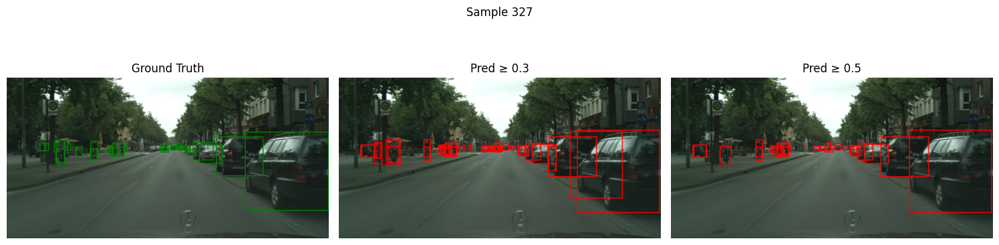

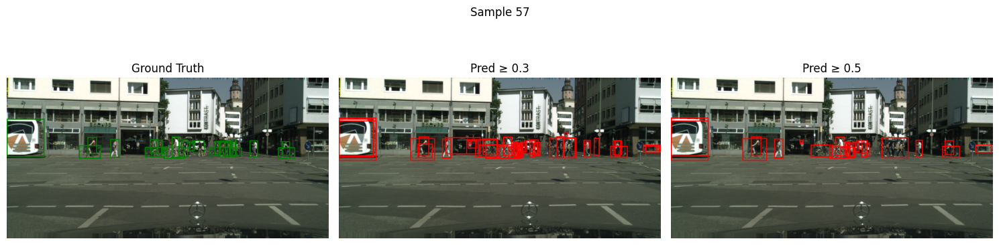

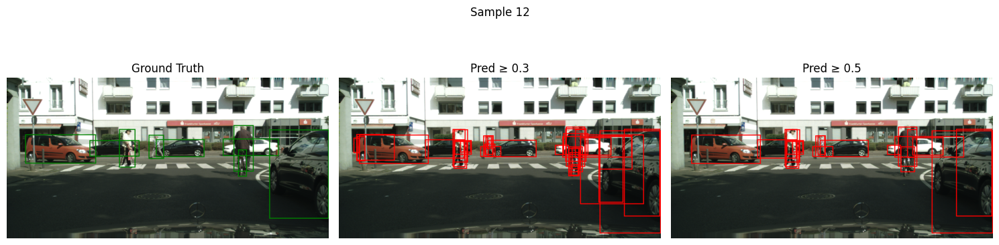

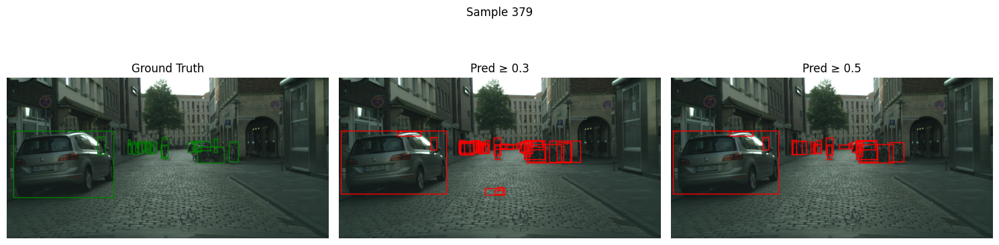

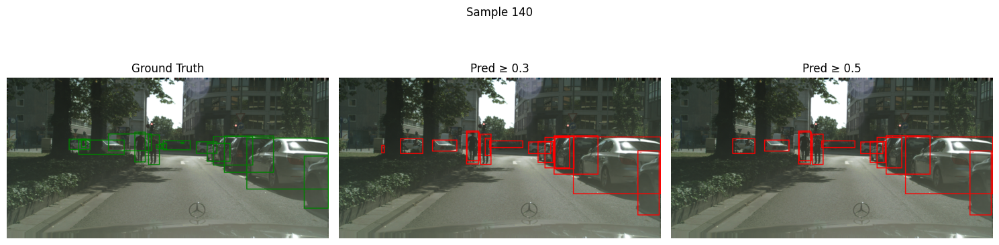

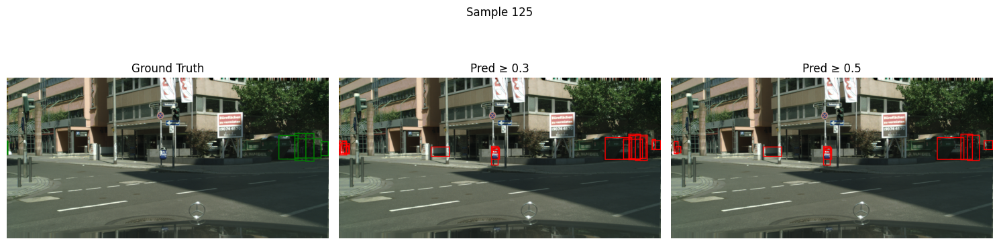

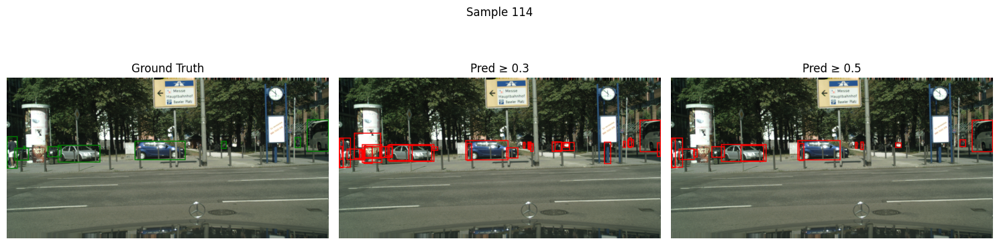

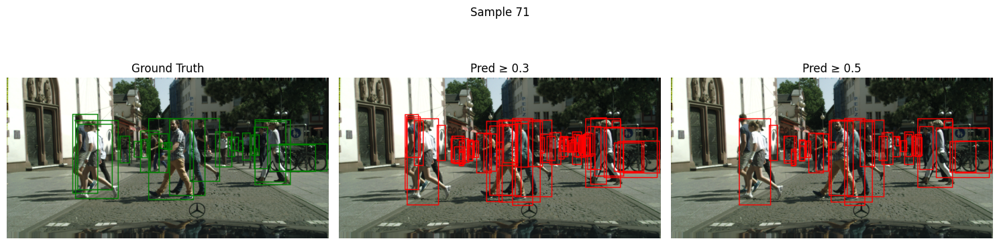

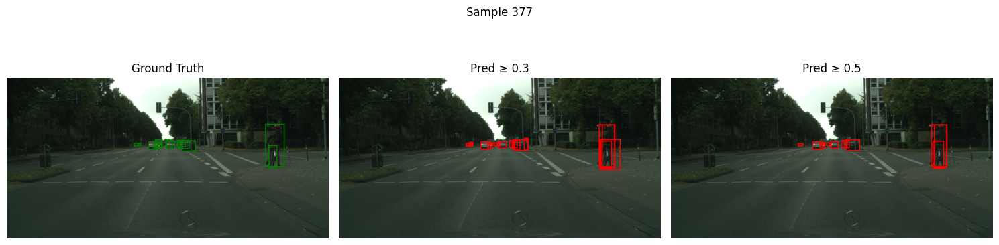

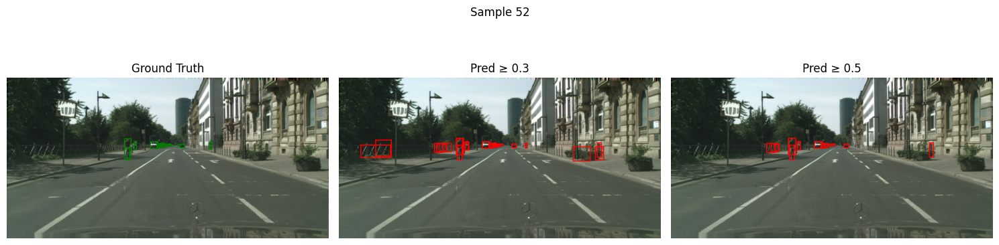

In [92]:

# ── USER SETTINGS ─────────────────────────────────────────────────────────────
CHECKPOINT_DIR    = "/content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/checkpoints"
BEST_MODEL_PATH   = f"{CHECKPOINT_DIR}/faster_rcnn_cityscapes_best.pth"
CONF_THRESHOLDS   = [0.3, 0.5]
NUM_SAMPLES       = 10
DEVICE            = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LINE_WIDTH        = 6    # ← increase for thicker lines
# ───────────────────────────────────────────────────────────────────────────────

# 1️⃣ Load model & weights
model = get_model(
    num_classes     = NUM_CLASSES,
    use_mask_rcnn   = USE_MASK_RCNN,
    freeze_backbone = FREEZE_BACKBONE
)
model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=DEVICE))
model.to(DEVICE).eval()

# 2️⃣ Sample indices from the validation dataset
random.seed(42)
indices = random.sample(range(len(val_dataset_fine)), NUM_SAMPLES)

# 3️⃣ Loop through samples and plot
for idx in indices:
    img_tensor, target = val_dataset_fine[idx]
    # Denormalize for display
    mean = torch.tensor([0.485,0.456,0.406]).view(3,1,1)
    std  = torch.tensor([0.229,0.224,0.225]).view(3,1,1)
    img_vis = (img_tensor * std + mean) * 255
    img_uint8 = img_vis.clamp(0,255).to(torch.uint8)

    # Draw GT
    gt_boxes  = target["boxes"]
    gt_labels = [str(CLASS_NAMES[int(l)]) for l in target["labels"]]
    img_gt = draw_bounding_boxes(
        img_uint8, gt_boxes, labels=gt_labels,
        colors="green", width=LINE_WIDTH
    )
    gt_pil = to_pil_image(img_gt)

    # Run inference
    with torch.no_grad():
        preds = model([img_tensor.to(DEVICE)])[0]

    # Prepare figure
    fig, axes = plt.subplots(1, len(CONF_THRESHOLDS)+1, figsize=(5*(len(CONF_THRESHOLDS)+1),5))
    axes[0].imshow(gt_pil)
    axes[0].set_title("Ground Truth")
    axes[0].axis("off")

    # Draw predictions at each threshold
    for i, thr in enumerate(CONF_THRESHOLDS, start=1):
        keep   = preds["scores"] >= thr
        boxes  = preds["boxes"][keep].cpu()
        scores = preds["scores"][keep].cpu()
        labels = [f"{s:.2f}" for s in scores]

        img_pred = draw_bounding_boxes(
            img_uint8.clone(),
            boxes,
            labels=labels,
            colors="red",
            width=LINE_WIDTH,
            font_size=12
        )
        axes[i].imshow(to_pil_image(img_pred))
        axes[i].set_title(f"Pred ≥ {thr:.1f}")
        axes[i].axis("off")

    plt.suptitle(f"Sample {idx}", y=0.92)
    plt.tight_layout()
    plt.show()




## 7. Final Evaluation on Internal Test Set

Now we will load our **best model** (checkpoint saved at highest mAP@.50), we’ll run inference on the held-out internal test split (≈298 images). This step will:

- Print the total number of test images and batches.
- Call `validate(..., is_test=True)` to compute:
  - **Test Loss** (average classification + box‐regression loss)
  - **mAP@[.50–.95]**: COCO standard precision averaged over IoU=[0.50:0.95]
  - **mAP@.50**: Precision at IoU ≥ 0.50
  - **mAP@.75**: Precision at IoU ≥ 0.75
  - **mAR**: Mean average recall across IoU thresholds
- Display a summary table of these metrics.  


In [93]:
# ─── Load Best Model Checkpoint ──────────────────────────────────────────────────
# Instantiate a fresh model (same config as training)
best_model = get_model(
    num_classes     = NUM_CLASSES,
    use_mask_rcnn   = USE_MASK_RCNN,
    freeze_backbone = FREEZE_BACKBONE
)

# Load the weights from the best checkpoint
checkpoint = torch.load(SAVE_PATH, map_location=device)
best_model.load_state_dict(checkpoint)

# Move to device and set to eval mode
best_model.to(device)
best_model.eval()

print(f"✅ Loaded best model from: {SAVE_PATH}")
print(f"   • Model on device: {device}")
print(f"   • Eval mode: {not best_model.training}")


✅ Loaded best model from: /content/drive/MyDrive/Colab Notebooks/Cityscapes_Term_Project_Data/checkpoints/faster_rcnn_cityscapes_best.pth
   • Model on device: cuda:0
   • Eval mode: True


In [94]:
# ─── 7. Final Evaluation on Internal Test Set ─────────────────────────────────

# Number of test images and batches
num_images  = len(internal_test_dataset)
num_batches = len(test_loader)
print(f"🔍 Running TEST on {num_images} images across {num_batches} batches...\n")

# Run inference & compute COCO‐style metrics on the test set
test_loss, test_metrics = validate(
    model,
    test_loader,
    device,
    conf_threshold=CONF_THRESHOLD,
    is_test=True,      # Switches header to "TEST"
    save_dir=None,     # We're not saving per‐epoch visuals here
    epoch=None
)

# Summarize the key metrics in a table
import pandas as pd

results = {
    "Test Loss": test_loss,
    "mAP@[.50:.95]": test_metrics.get("map_50_95", test_metrics.get("map", torch.tensor(0.0))).item(),
    "mAP@.50":      test_metrics.get("map_50",     torch.tensor(0.0)).item(),
    "mAP@.75":      test_metrics.get("map_75",     torch.tensor(0.0)).item(),
    "mAR":          test_metrics.get("mar",        test_metrics.get("mar_100", torch.tensor(0.0))).item(),
}

df_test = pd.DataFrame([results])
print("\n📊 Internal Test Set Results:")
print(df_test.to_string(index=False))


🔍 Running TEST on 297 images across 149 batches...


========================🔍 TEST Loop=========================


TEST Batches:   0%|          | 0/149 [00:00<?, ?it/s]


📊 TEST Results:
   • Avg Loss      :  1.0079
   • mAP@[.50:.95] :  0.1750
   • mAP@.50       :  0.3457
   • mAP@.75       :  0.1601
   • mAR           :  0.2758

📊 Internal Test Set Results:
 Test Loss  mAP@[.50:.95]  mAP@.50  mAP@.75      mAR
  1.007944       0.175007 0.345693 0.160073 0.275758


### 7.1 Visualize Test Set Predictions

It’s often helpful to qualitatively inspect how the model performs on unseen test images. Below is a code cell that:

1. Grabs the first **`num_show`** images from `test_loader`.  
2. Runs them through the **best model** already loaded.  
3. Filters predictions by `CONF_THRESHOLD`.  
4. Draws **ground-truth** boxes in **green** and **predicted** boxes (with scores) in **red**.  
5. Displays them side by side for quick visual comparison.  


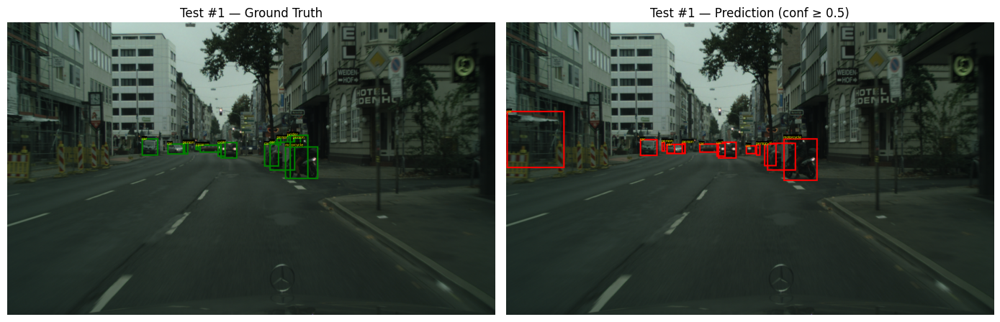

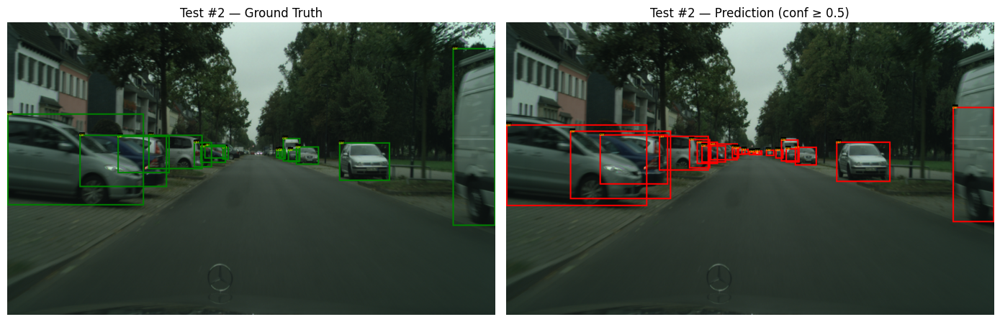

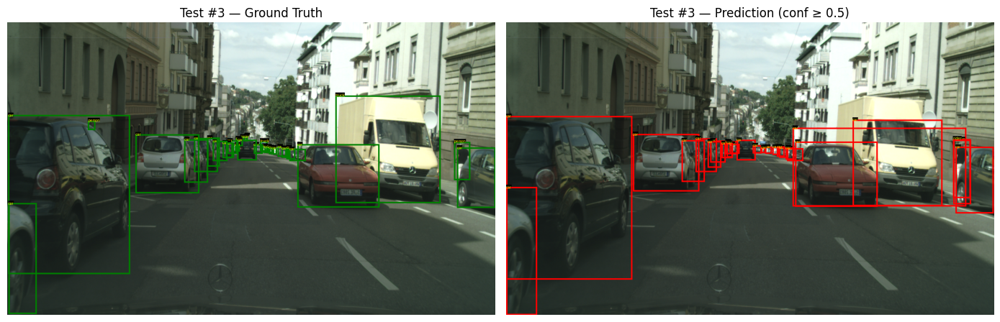

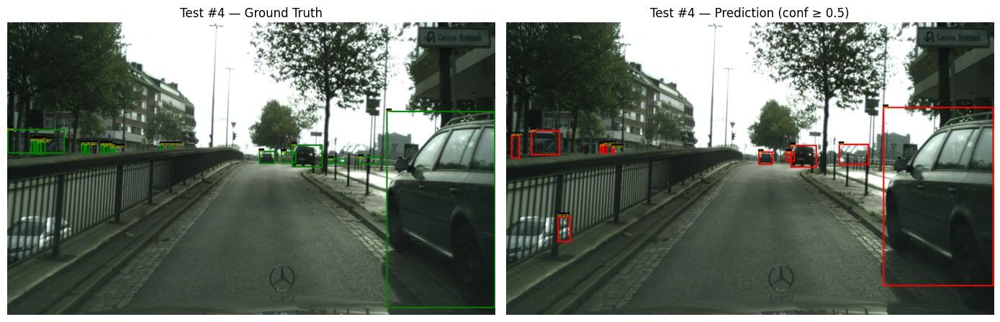

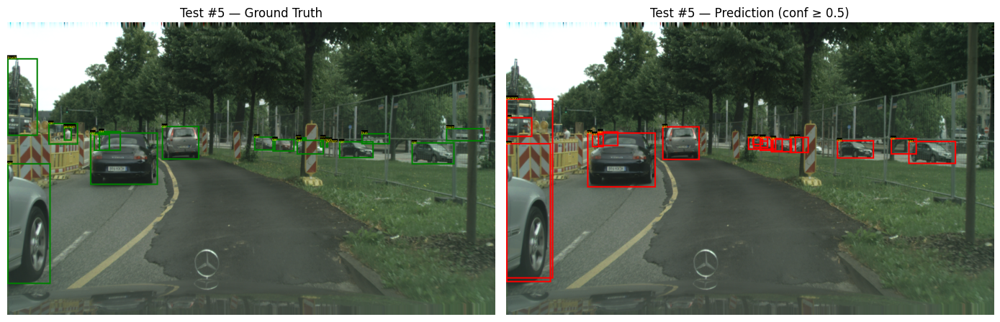

In [106]:
# ── SETTINGS & IMPORTS ─────────────────────────────────────────────────────────
import torch
import random
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from PIL import ImageDraw, ImageFont

# Mapping from label IDs to human-readable class names
CLASS_NAMES = {
    1: "person", 2: "rider", 3: "car", 4: "truck",
    5: "bus",    6: "train", 7: "motorcycle", 8: "bicycle"
}

# Visualization parameters
CONF_THRESHOLD = 0.5
NUM_SHOW       = 5
LINE_WIDTH     = 4
FONT_SIZE      = 24

# Try to load a TrueType font; fallback to default if unavailable
try:
    font = ImageFont.truetype("arial.ttf", size=FONT_SIZE)
except IOError:
    font = ImageFont.load_default()

# ── VISUALIZATION LOOP ───────────────────────────────────────────────────────
model.eval()
count = 0

with torch.no_grad():
    for images, targets in test_loader:
        images  = [img.to(device) for img in images]
        outputs = model(images)

        for img_tensor, tgt, pred in zip(images, targets, outputs):
            if count >= NUM_SHOW:
                break

            # Denormalize and convert tensor to PIL image
            mean = torch.tensor([0.485, 0.456, 0.406], device=img_tensor.device).view(3,1,1)
            std  = torch.tensor([0.229, 0.224, 0.225], device=img_tensor.device).view(3,1,1)
            img_vis   = (img_tensor * std + mean).clamp(0,1)
            img_uint8 = (img_vis * 255).to(torch.uint8)
            pil_img   = to_pil_image(img_uint8)

            # Create separate canvases for GT and predictions
            gt_canvas   = pil_img.copy()
            pred_canvas = pil_img.copy()
            draw_gt     = ImageDraw.Draw(gt_canvas)
            draw_pred   = ImageDraw.Draw(pred_canvas)

            # --- Draw Ground Truth ---
            gt_boxes  = tgt["boxes"].cpu().tolist()
            gt_labels = [CLASS_NAMES[int(l.item())] for l in tgt["labels"].cpu()]

            for (x0, y0, x1, y1), label in zip(gt_boxes, gt_labels):
                # Draw box
                draw_gt.rectangle([x0, y0, x1, y1], outline="green", width=LINE_WIDTH)
                # Measure text bounding box
                tb = draw_gt.textbbox((0,0), label, font=font)
                text_w, text_h = tb[2] - tb[0], tb[3] - tb[1]
                # Draw label background (semi-opaque)
                draw_gt.rectangle([x0, y0 - text_h, x0 + text_w, y0], fill=(0,0,0,160))
                # Draw text
                draw_gt.text((x0, y0 - text_h), label, fill="yellow", font=font)

            # --- Draw Predictions ---
            keep = pred["scores"] >= CONF_THRESHOLD
            pred_boxes  = pred["boxes"][keep].cpu().tolist()
            pred_labels = [CLASS_NAMES[int(l.item())] for l in pred["labels"][keep].cpu()]

            for (x0, y0, x1, y1), label in zip(pred_boxes, pred_labels):
                draw_pred.rectangle([x0, y0, x1, y1], outline="red", width=LINE_WIDTH)
                tb = draw_pred.textbbox((0,0), label, font=font)
                text_w, text_h = tb[2] - tb[0], tb[3] - tb[1]
                draw_pred.rectangle([x0, y0 - text_h, x0 + text_w, y0], fill=(0,0,0,160))
                draw_pred.text((x0, y0 - text_h), label, fill="yellow", font=font)

            # Display side by side
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
            ax1.imshow(gt_canvas);   ax1.set_title(f"Test #{count+1} — Ground Truth"); ax1.axis("off")
            ax2.imshow(pred_canvas); ax2.set_title(f"Test #{count+1} — Prediction (conf ≥ {CONF_THRESHOLD})"); ax2.axis("off")
            plt.tight_layout()
            plt.show()

            count += 1

        if count >= NUM_SHOW:
            break





### 7.2 Weights and Biases Summary

- **Weight tensors**: 57  
- **Bias tensors**: 15  

| Parameter Type | # Tensors | Total Params  |
|----------------|-----------|---------------|
| **Weights**    | 57        | 41,108,224    |
| **Biases**     | 15        | 4,412         |
| **Grand Total**| 72        | 41,112,636    |

> Each **weight tensor** (e.g. a convolutional kernel or fully-connected layer’s weight matrix) contains many scalar parameters; each **bias tensor** adds a learnable offset per channel or neuron. Summing all of them yields the total trainable parameters in the model.


In [22]:
import torch

# 7.2 Re-load trained model
model = get_model(
    num_classes     = NUM_CLASSES,
    use_mask_rcnn   = USE_MASK_RCNN,
    freeze_backbone = FREEZE_BACKBONE
)
model.load_state_dict(torch.load(SAVE_PATH, map_location=device))
model.to(device).eval()

# 2️⃣ Gather all trainable weight & bias tensors
weight_params = [(name, p) for name, p in model.named_parameters()
                 if p.requires_grad and "weight" in name]
bias_params   = [(name, p) for name, p in model.named_parameters()
                 if p.requires_grad and "bias"   in name]

# 3️⃣ Print summary
print(f"{len(weight_params)} weight tensors, {len(bias_params)} bias tensors\n")

total_w = 0
print("Weights:")
for name, p in weight_params:
    cnt = p.numel()
    total_w += cnt
    shape = tuple(p.shape)
    print(f"  {name:60s}  shape={shape}  params={cnt:,}")

total_b = 0
print("\nBiases:")
for name, p in bias_params:
    cnt = p.numel()
    total_b += cnt
    shape = tuple(p.shape)
    print(f"  {name:60s}  shape={shape}  params={cnt:,}")

print(f"\nTotal weight params: {total_w:,}")
print(f"Total bias   params: {total_b:,}")
print(f"Grand total  params: {total_w + total_b:,}")


57 weight tensors, 15 bias tensors

Weights:
  backbone.body.layer2.0.conv1.weight                           shape=(128, 256, 1, 1)  params=32,768
  backbone.body.layer2.0.conv2.weight                           shape=(128, 128, 3, 3)  params=147,456
  backbone.body.layer2.0.conv3.weight                           shape=(512, 128, 1, 1)  params=65,536
  backbone.body.layer2.0.downsample.0.weight                    shape=(512, 256, 1, 1)  params=131,072
  backbone.body.layer2.1.conv1.weight                           shape=(128, 512, 1, 1)  params=65,536
  backbone.body.layer2.1.conv2.weight                           shape=(128, 128, 3, 3)  params=147,456
  backbone.body.layer2.1.conv3.weight                           shape=(512, 128, 1, 1)  params=65,536
  backbone.body.layer2.2.conv1.weight                           shape=(128, 512, 1, 1)  params=65,536
  backbone.body.layer2.2.conv2.weight                           shape=(128, 128, 3, 3)  params=147,456
  backbone.body.layer2.2.conv3.we

## **APPENDIX**

### Hyperparameter Grid Search for Faster R-CNN Overfit Sanity Check

This cell runs a quick grid search over:

- **head_lr**: learning rate for the box‐head  
- **backbone_lr**: learning rate for unfrozen backbone layers  
- **weight_decay**: L2 regularization  
- **unfreeze**: whether to unfreeze just `layer4+fpn` or the entire backbone  
- **score_thresh**: confidence threshold for detection filtering  

It samples **20** train images (overfit sanity), fine‐tunes for **30 epochs** per config, computes COCO‐style **mAP@.50**, and reports the **best configuration**.  

You can toggle the entire grid search on/off by setting `RUN_GRID = True/False`.  


In [ ]:
# ─── 6.2 Overfit Sanity Grid Search (Toggleable) ──────────────────────────────
RUN_GRID     = False    # ← Set to True to run the grid search, False to skip
GRID_SUBSET  = 20
GRID_EPOCHS  = 30
FINAL_EPOCHS = 30
GRID_RES     = (512, 1024)
#NUM_WORKERS  = 2

# hyperparameter ranges (unchanged)
head_lrs      = [1e-2, 1e-3, 5e-4]
backbone_lrs  = [1e-3, 1e-4, 1e-5]
weight_decays = [0.0, 1e-4, 1e-3]
unfreeze_opts = ["layer4+fpn", "full"]
score_thrs    = [0.0, 0.05, 0.1]

param_grid = [
    {"head_lr":h, "backbone_lr":b, "wd":wd, "unfreeze":uf, "thr":thr}
    for (h,b,wd,uf,thr) in product(head_lrs, backbone_lrs, weight_decays, unfreeze_opts, score_thrs)
]

if RUN_GRID:
    print(f"🔢 Total configs to try: {len(param_grid)}")
    # prepare tiny overfit subset
    full_train = FastCS("train", GRID_RES)
    val_ds     = FastCS("val",   GRID_RES)
    train_ds   = Subset(full_train, random.sample(range(len(full_train)), GRID_SUBSET))
    train_loader = DataLoader(train_ds, BATCH_SIZE, True,
                              num_workers=NUM_WORKERS, collate_fn=lambda b:tuple(zip(*b)))
    val_loader   = DataLoader(val_ds,    BATCH_SIZE, False,
                              num_workers=NUM_WORKERS, collate_fn=lambda b:tuple(zip(*b)))

    results = []
    for cfg in param_grid:
        results.append(run(cfg))
    # pick the best by mAP@.50
    best = max(results, key=lambda x: x["best50"])

    # expose `best` for later use
    BEST_GRID_CONFIG = best["cfg"]
    BEST_GRID_SCORE  = best["best50"]

    print(f"\n🏆 Best config → {BEST_GRID_CONFIG}  mAP@.50 = {BEST_GRID_SCORE:.3f}")

else:
    print("▶️ RUN_GRID=False → skipping overfit sanity check")




